<a href="https://colab.research.google.com/github/rishab-gangwar/PracticeCodes/blob/master/EDA01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_excel("/content/drive/MyDrive/BookingData.xlsx")

In [ ]:
df.head(5)

In [4]:
column_dtype=df.dtypes

In [5]:
set(column_dtype)

{dtype('<M8[ns]'), dtype('float64'), dtype('O')}

## Get character set for each column

In [6]:
def get_unique_chars_in_cols(df):
  unique_char_all={}
  for col in (df.columns):
    unique_char=list(set(df[col].astype('str').str.cat()))
    unique_char_all[col]=(''.join(sorted(unique_char)))

  return pd.DataFrame(unique_char_all.items())
column_info=get_unique_chars_in_cols(df)

In [7]:
column_info = pd.concat([column_info, pd.DataFrame(list(column_dtype))], axis=1)

## null values

In [8]:
column_info = pd.concat([column_info, pd.DataFrame(list(df.isnull().sum()))], axis=1)

In [ ]:
column_info

In [10]:
column_info.columns=['column_names','character_set','dtype','nulls']

In [11]:
def get_column_info(col):
  return column_info[column_info["column_names"]==col]

In [12]:
get_column_info('BookingNumber')

,column_names,character_set,dtype,nulls
0,BookingNumber,-0123456789:AEFGHILMRSTUV,object,0


In [13]:
def missing_values_table(df):
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)


        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})

        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)

        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")

        return mis_val_table_ren_columns
print(missing_values_table(df))

Your selected dataframe has 64 columns.
There are 58 columns that have missing values.
                               Missing Values  % of Total Values
DispatchInstructions                    56801              100.0
WaitingDuration                         55722               98.1
DropMeetingPoint                        55262               97.3
MiscNotes                               55090               97.0
DropETA                                 54099               95.2
AdminInstructions                       50118               88.2
BookingRequests                         48083               84.7
Id_BookingCopyOf                        44061               77.6
DropTravelClass                         43605               76.8
PickupMeetingPoint                      43581               76.7
PickupTravelClass                       41046               72.3
DropInstruction                         39438               69.4
BookingRequestedBy                      35251               62.1
Dro

<Axes: >

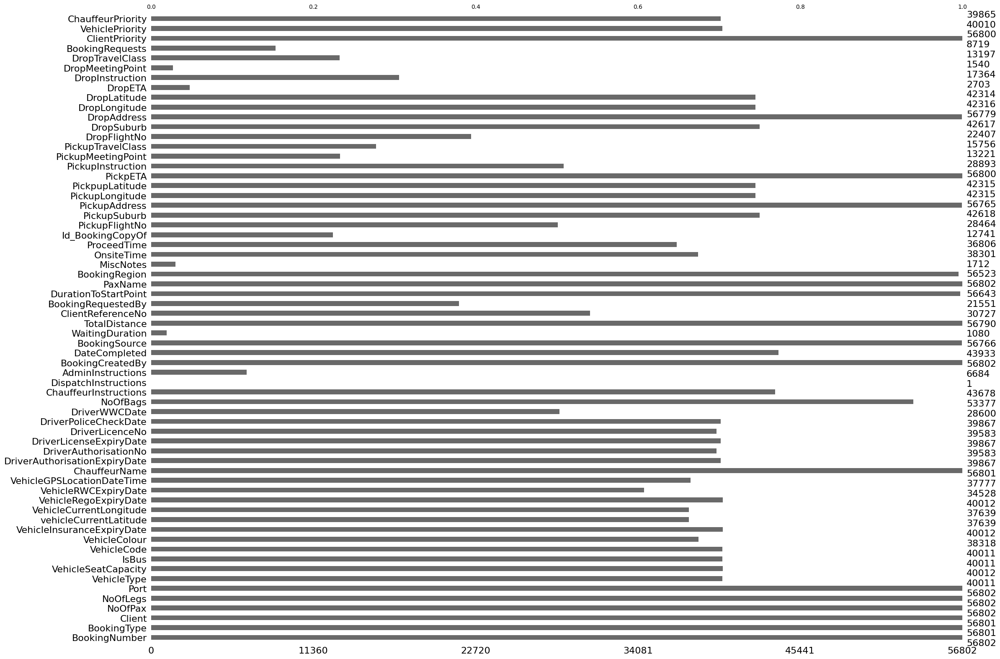

In [14]:
import missingno as msno
msno.bar(df)

<Axes: >

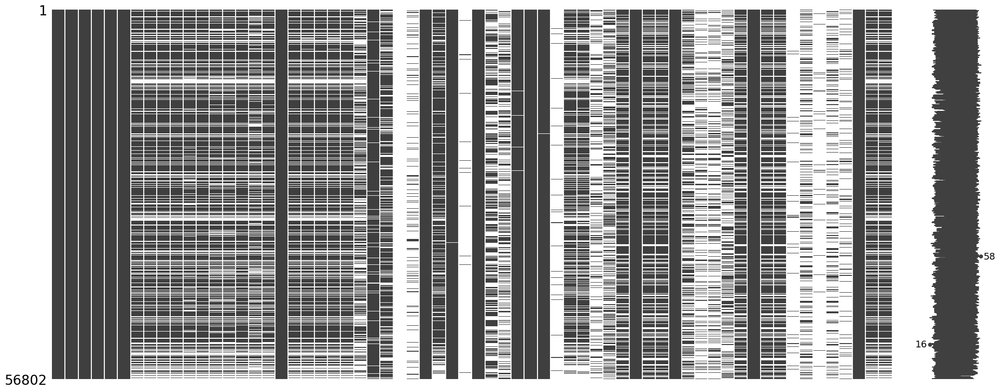

In [15]:
msno.matrix(df)

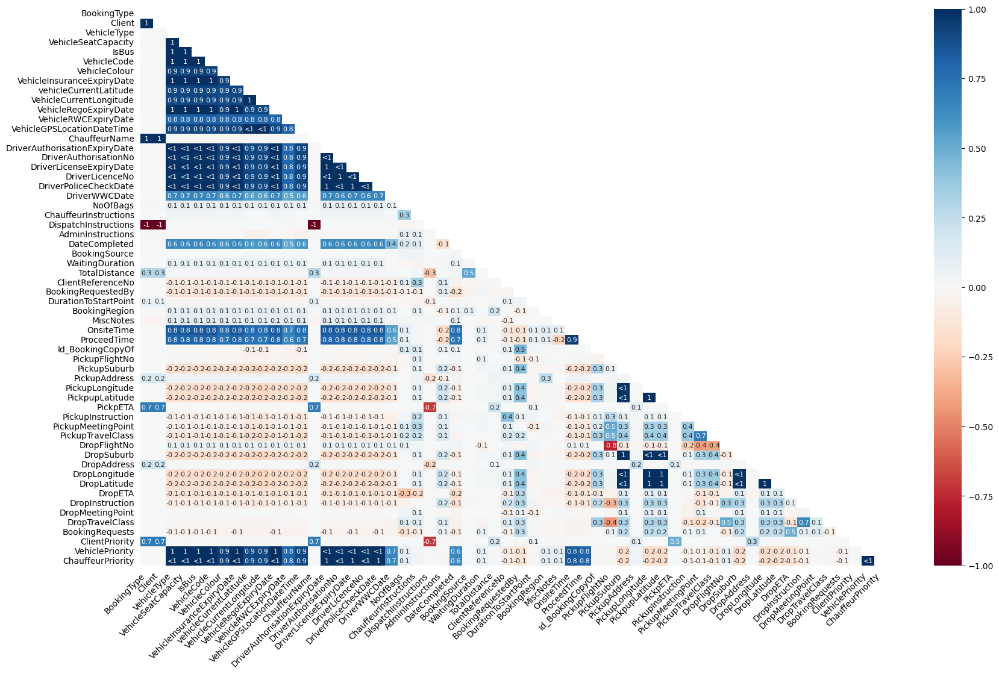

In [16]:
fig = msno.heatmap(df,fontsize=10)
fig_copy = fig.get_figure()
fig_copy.savefig('heatmap.png', bbox_inches = 'tight')

In [17]:
column_info[column_info["column_names"]=="DispatchInstructions"]

,column_names,character_set,dtype,nulls
26,DispatchInstructions,024AVan,object,56801


In [18]:
#give names of column that have not null rows to be atleast 20% of total rows.
column_names_eligible=list(column_info[column_info["nulls"]<.8*(len(df))]['column_names'])

In [19]:
len(column_names_eligible),len(df.columns)

(57, 64)

In [20]:
df_2=df[column_names_eligible]

<Axes: >

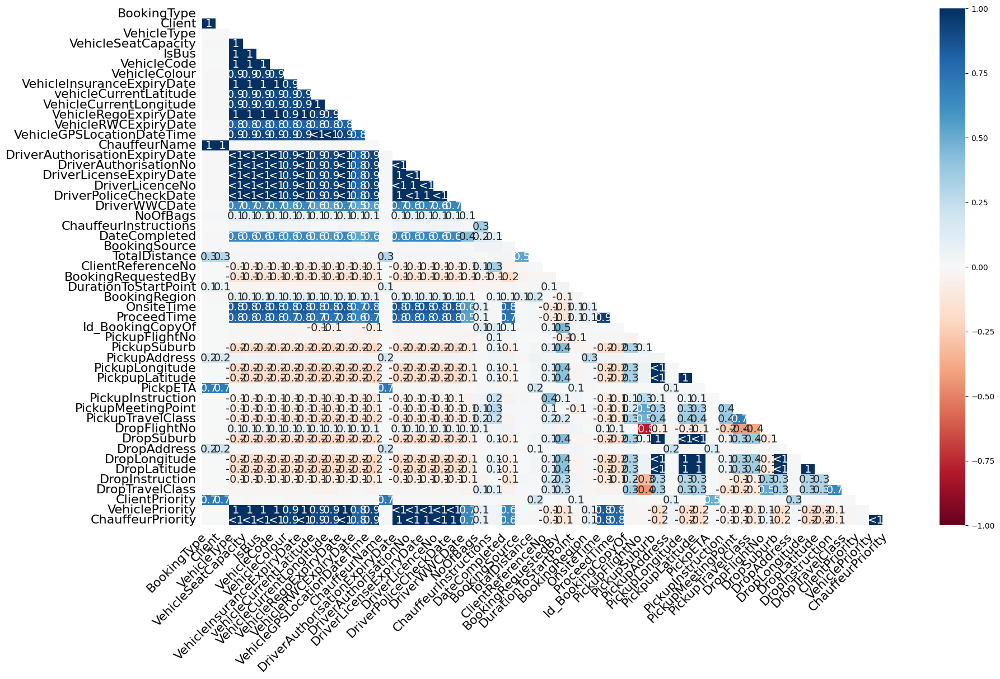

In [21]:
msno.heatmap(df_2)


column wise null value analysis
---



In [22]:
column_names_eligible

['BookingNumber',
 'BookingType',
 'Client',
 'NoOfPax',
 'NoOfLegs',
 'Port',
 'VehicleType',
 'VehicleSeatCapacity',
 'IsBus',
 'VehicleCode',
 'VehicleColour',
 'VehicleInsuranceExpiryDate',
 'vehicleCurrentLatitude',
 'VehicleCurrentLongitude',
 'VehicleRegoExpiryDate',
 'VehicleRWCExpiryDate',
 'VehicleGPSLocationDateTime',
 'ChauffeurName',
 'DriverAuthorisationExpiryDate',
 'DriverAuthorisationNo',
 'DriverLicenseExpiryDate',
 'DriverLicenceNo',
 'DriverPoliceCheckDate',
 'DriverWWCDate',
 'NoOfBags',
 'ChauffeurInstructions',
 'BookingCreatedBy',
 'DateCompleted',
 'BookingSource',
 'TotalDistance',
 'ClientReferenceNo',
 'BookingRequestedBy',
 'DurationToStartPoint',
 'PaxName',
 'BookingRegion',
 'OnsiteTime',
 'ProceedTime',
 'Id_BookingCopyOf',
 'PickupFlightNo',
 'PickupSuburb',
 'PickupAddress',
 'PickupLongitude',
 'PickpupLatitude',
 'PickpETA',
 'PickupInstruction',
 'PickupMeetingPoint',
 'PickupTravelClass',
 'DropFlightNo',
 'DropSuburb',
 'DropAddress',
 'DropLongi

In [23]:
f=open('/content/col_info.txt','a')
count=0
for col in column_names_eligible:
  count+=1
  info=f'{count}){col}  {df_2[col].dtype} dtype: \n\n null values \t\t\t {df_2[col].isnull().sum()}\n {df_2[col].value_counts()}\n\n unique values :{len(df_2[col].value_counts())} \n'
  f.write(info)
f.close()

In [24]:
get_column_info('PickpupLatitude')

,column_names,character_set,dtype,nulls
46,PickpupLatitude,-.0123456789an,float64,14487


In [25]:
numerical_cols = [cname for cname in df_2.columns if df_2[cname].dtype in ['int64', 'float64']]
categorical_cols=[cname for cname in df_2.columns if df_2[cname].dtype in ['object']]
datetime_cols=[cname for cname in df_2.columns if df_2[cname].dtype in ['<M8[ns]']]

In [26]:
len(numerical_cols),len(datetime_cols),len(categorical_cols),len(column_names_eligible)

(10, 7, 40, 57)

### mode imputation

In [27]:
df_2_num=df_2[numerical_cols]

In [28]:
from sklearn.impute import SimpleImputer
df2_frequent = df_2[numerical_cols].copy()
mean_imputer = SimpleImputer(strategy='most_frequent')
df2_frequent.iloc[:,:] = mean_imputer.fit_transform(df2_frequent)

In [29]:
df2_frequent.isnull().sum(),len(df2_frequent.columns)

(VehicleSeatCapacity     0
 IsBus                   0
 NoOfBags                0
 TotalDistance           0
 DurationToStartPoint    0
 Id_BookingCopyOf        0
 PickupLongitude         0
 PickpupLatitude         0
 DropLongitude           0
 DropLatitude            0
 dtype: int64,
 10)

In [30]:
categorical_cols

['BookingNumber',
 'BookingType',
 'Client',
 'NoOfPax',
 'NoOfLegs',
 'Port',
 'VehicleType',
 'VehicleCode',
 'VehicleColour',
 'VehicleInsuranceExpiryDate',
 'vehicleCurrentLatitude',
 'VehicleCurrentLongitude',
 'ChauffeurName',
 'DriverAuthorisationExpiryDate',
 'DriverAuthorisationNo',
 'DriverLicenseExpiryDate',
 'DriverLicenceNo',
 'DriverWWCDate',
 'ChauffeurInstructions',
 'BookingCreatedBy',
 'DateCompleted',
 'BookingSource',
 'ClientReferenceNo',
 'BookingRequestedBy',
 'PaxName',
 'BookingRegion',
 'PickupFlightNo',
 'PickupSuburb',
 'PickupAddress',
 'PickupInstruction',
 'PickupMeetingPoint',
 'PickupTravelClass',
 'DropFlightNo',
 'DropSuburb',
 'DropAddress',
 'DropInstruction',
 'DropTravelClass',
 'ClientPriority',
 'VehiclePriority',
 'ChauffeurPriority']

## column manipulation![1__d388oZVBckTzJHKr93L-A.webp](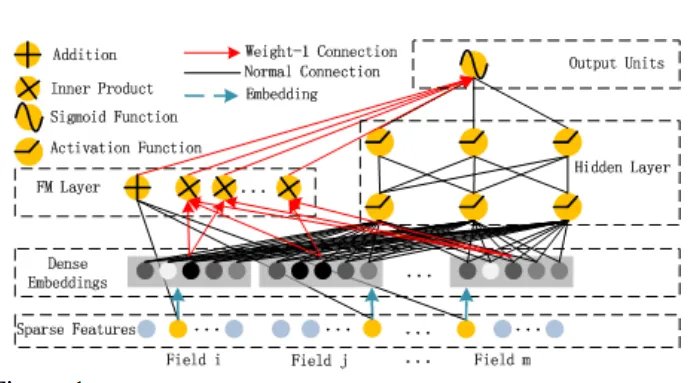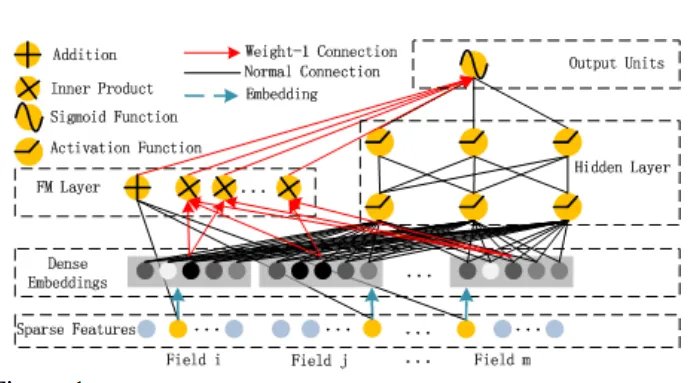)

### columns_unchanged

columns in correct dtype
```
    1)VehicleType
    2)VehicleSeatCapacity
    3)Isbus
    4)VehicleCode  
    9)VehicleRegoExpiryDate
    10)VehicleRWCExpiryDate
    11)VehicleGPSLocationDateTime
    13)DriverAuthorisationNo
    15)DriverLicenceNo
    16)DriverPoliceCheckDate
    18)ChauffeurInstructions
    22)WaitingDuration
    23)ClientReferenceNo
    24)BookingRequestedBy
    25)MiscNotes
    26)OnsiteTime
    27)ProceedTime
    28)Id_BookingCopyOf
    29)PickupFlightNo
    30)PickupSuburb
    31)PickupLongitude
    32)PickpupLatitude
    33)PickupInstruction
    34)PickupMeetingPoint
    35)PickupTravelClass
    36)DropFlightNo
    37)DropSuburb
    38)DropLongitude
    39)DropLatitude
    40)DropETA
    41)DropInstruction
    42)DropMeetingPoint
    43)DropTravelClass
    44)BookingRequests
    45)VehiclePriority
    46)ChauffeurPriority
```




### vehicle color

In [31]:
df_2=df_2[df_2["VehicleColour"]!=10]

In [32]:
df_2["VehicleColour"].value_counts(dropna=False)

Black           22740
NaN             18484
White            9470
Silver           3256
Gray             1362
DarkGray          484
SteelBlue         197
LightGray         194
Navy              185
MidnightBlue      127
DodgerBlue        113
RoyalBlue          94
DeepSkyBlue        73
DarkBlue           10
Red                 7
DimGray             3
Sienna              1
Coral               1
Name: VehicleColour, dtype: int64

### VehicleInsuranceExpiryDate

In [33]:
df_2["VehicleInsuranceExpiryDate"]

0                        NaN
1        2023-12-14 00:00:00
2        2023-09-20 00:00:00
3        2024-06-30 00:00:00
4        2023-09-28 00:00:00
                ...         
56797                    NaN
56798                    NaN
56799                    NaN
56800                    NaN
56801                    NaN
Name: VehicleInsuranceExpiryDate, Length: 56801, dtype: object

In [34]:
df_2=df_2[df_2["VehicleInsuranceExpiryDate"]!="PassengerName"]

In [35]:
df_2["VehicleInsuranceExpiryDate"]=pd.to_datetime(df_2["VehicleInsuranceExpiryDate"])

In [36]:
df_2["VehicleInsuranceExpiryDate"].value_counts(dropna=False)

NaT           16790
2024-06-30     3009
2023-10-13     2631
2023-08-31     1112
2050-01-01     1011
              ...  
2024-07-03        1
2024-03-10        1
2030-12-31        1
2023-11-02        1
2024-11-07        1
Name: VehicleInsuranceExpiryDate, Length: 205, dtype: int64

### vehicleCurrentLatitude

In [37]:
df_2["vehicleCurrentLatitude"].dtype

dtype('O')

In [38]:
df_2["vehicleCurrentLatitude"].value_counts(dropna=False)

 NaN          19163
-12.385890      469
-16.852002      415
-37.811411      302
-33.922670      268
              ...  
-31.942297        1
-34.907388        1
-27.576520        1
-33.925468        1
-31.880378        1
Name: vehicleCurrentLatitude, Length: 391, dtype: int64

In [39]:
df_2=df_2[df_2["vehicleCurrentLatitude"]!='ADELAIDE']

In [40]:
df_2["vehicleCurrentLatitude"]=df_2["vehicleCurrentLatitude"].astype('float64')

In [41]:
df_2["vehicleCurrentLatitude"].value_counts(dropna=False)

 NaN          19163
-12.385890      469
-16.852002      415
-37.811411      302
-33.922670      268
              ...  
-31.942297        1
-34.907388        1
-27.576520        1
-33.925468        1
-31.880378        1
Name: vehicleCurrentLatitude, Length: 391, dtype: int64

### VehicleCurrentLongitude




In [42]:
df_2["VehicleCurrentLongitude"].dtype

dtype('O')

In [43]:
df_2["VehicleCurrentLongitude"].value_counts(dropna=False)

NaN           19163
130.892990      469
145.749212      415
144.970407      302
151.079154      268
              ...  
115.973475        1
138.607173        1
153.098927        1
151.223169        1
115.883144        1
Name: VehicleCurrentLongitude, Length: 391, dtype: int64

In [44]:
df_2["VehicleCurrentLongitude"]=df_2["VehicleCurrentLongitude"].astype('float64')

In [45]:
df_2["VehicleCurrentLongitude"].value_counts(dropna=False)

NaN           19163
130.892990      469
145.749212      415
144.970407      302
151.079154      268
              ...  
115.973475        1
138.607173        1
153.098927        1
151.223169        1
115.883144        1
Name: VehicleCurrentLongitude, Length: 391, dtype: int64

In [ ]:
#correct datatype

### DriverAuthorisationExpiryDate

In [46]:
df_2["DriverAuthorisationExpiryDate"].dtype

dtype('O')

In [47]:
df_2["DriverAuthorisationExpiryDate"]=df_2["DriverAuthorisationExpiryDate"].astype('datetime64')

In [48]:
df_2["DriverAuthorisationExpiryDate"].value_counts(dropna=False)

NaT           16935
2024-03-10     1012
2023-09-20      487
2024-06-17      471
2026-02-03      466
              ...  
2024-06-18        1
2026-12-13        1
2024-08-20        1
2023-12-05        1
2023-12-22        1
Name: DriverAuthorisationExpiryDate, Length: 335, dtype: int64

In [49]:
df_2["DriverAuthorisationExpiryDate"].dtype

dtype('<M8[ns]')

### DriverAuthorisationNo

In [50]:
df_2["DriverAuthorisationNo"].dtype

dtype('O')

### DriverLicenseExpiryDate

In [55]:
df_2["DriverLicenseExpiryDate"].dtype

dtype('<M8[ns]')

In [56]:
df_2["DriverLicenseExpiryDate"]=df_2["DriverLicenseExpiryDate"].astype('datetime64')

<ipython-input-56-6b13d5b914d0>:1: FutureWarning: Passing unit-less datetime64 dtype to .astype is deprecated and will raise in a future version. Pass 'datetime64[ns]' instead
  df_2["DriverLicenseExpiryDate"]=df_2["DriverLicenseExpiryDate"].astype('datetime64')


In [57]:
df_2["DriverLicenseExpiryDate"].value_counts(dropna=False)

NaT           16935
2024-03-10      636
2024-08-26      521
2025-02-03      466
2023-03-10      376
              ...  
2026-04-26        1
2028-06-07        1
2028-07-02        1
2024-06-18        1
2025-10-15        1
Name: DriverLicenseExpiryDate, Length: 350, dtype: int64

In [58]:
#correct dtype

### DriverWWCDate
[dataloss 229]


In [59]:
df_2["DriverWWCDate"].dtype

dtype('O')

In [60]:
df_2["DriverWWCDate"]=pd.to_datetime(df_2["DriverWWCDate"], errors = 'coerce')

In [61]:
df_2["DriverWWCDate"].value_counts(dropna=False)

NaT           28431
2030-03-03    11695
2022-04-30     1723
2024-12-31      559
2026-12-03      466
              ...  
2030-01-01        2
2030-12-30        1
2025-12-21        1
2024-12-30        1
2024-11-09        1
Name: DriverWWCDate, Length: 133, dtype: int64

### DateCompleted

In [62]:
df_2['DateCompleted']

0                        NaN
1        2023-07-02 17:25:00
2        2023-07-02 06:45:00
3        2023-07-02 09:51:54
4        2023-07-02 14:26:20
                ...         
56797                    NaN
56798                    NaN
56799                    NaN
56800                    NaN
56801                    NaN
Name: DateCompleted, Length: 56801, dtype: object

In [63]:
df_2["DateCompleted"]=pd.to_datetime(df_2["DateCompleted"], errors = 'coerce')

In [64]:
df_2['DateCompleted'].dtype

dtype('<M8[ns]')

### NoOfPax

In [65]:
df_2['NoOfPax']=df_2['NoOfPax'].astype('int64')

### NoOfLegs

In [ ]:
df_2['NoOfLegs']=df_2['NoOfLegs'].astype('int64')

###

### overview

In [66]:
numerical_cols = [cname for cname in df_2.columns if df_2[cname].dtype in ['int64', 'float64']]
categorical_cols=[cname for cname in df_2.columns if df_2[cname].dtype in ['object']]
datetime_cols=[cname for cname in df_2.columns if df_2[cname].dtype in ['<M8[ns]']]


In [67]:
len(numerical_cols),len(datetime_cols),len(categorical_cols),len(column_names_eligible)

(13, 12, 32, 57)

In [68]:
categorical_cols

['BookingNumber',
 'BookingType',
 'Client',
 'NoOfLegs',
 'Port',
 'VehicleType',
 'VehicleCode',
 'VehicleColour',
 'ChauffeurName',
 'DriverAuthorisationNo',
 'DriverLicenceNo',
 'ChauffeurInstructions',
 'BookingCreatedBy',
 'BookingSource',
 'ClientReferenceNo',
 'BookingRequestedBy',
 'PaxName',
 'BookingRegion',
 'PickupFlightNo',
 'PickupSuburb',
 'PickupAddress',
 'PickupInstruction',
 'PickupMeetingPoint',
 'PickupTravelClass',
 'DropFlightNo',
 'DropSuburb',
 'DropAddress',
 'DropInstruction',
 'DropTravelClass',
 'ClientPriority',
 'VehiclePriority',
 'ChauffeurPriority']

In [69]:
df_2[df_2["ChauffeurName"]==' ']=np.nan

In [70]:
df_2["ChauffeurName"].value_counts(dropna=False)

NaN                          16935
LUIZ DE BARROS CANHA          1012
MARYANN DYSON                  466
MARCUS REVEZ                   292
ADRIANUS NOORDANUS             271
                             ...  
ANDREW SARRIE                    1
JOSIF KORNITS                    1
MUNEEB AHMED                     1
AINGARAMOORTH SIVAPRAKASH        1
PRADEEP DRIVER                   1
Name: ChauffeurName, Length: 389, dtype: int64

In [71]:
len(df_2),len(df)

(56801, 56802)

In [72]:
df[categorical_cols]

,BookingNumber,BookingType,Client,NoOfLegs,Port,VehicleType,VehicleCode,VehicleColour,ChauffeurName,DriverAuthorisationNo,...,PickupMeetingPoint,PickupTravelClass,DropFlightNo,DropSuburb,DropAddress,DropInstruction,DropTravelClass,ClientPriority,VehiclePriority,ChauffeurPriority
0,7490751,Booking,VIRGIN AUSTRALIA HOLDINGS LTD - PERTH,1,PERTH,NaN,NaN,NaN,,NaN,...,NaN,NaN,NaN,PERTH,707 WELLINGTON STREET,NaN,NaN,Low,NaN,NaN
1,7490752,Booking,JETCONNECT LTD,1,MELBOURNE,PEOPLE MOVER (6-7 SEATS),130,Black,BIBHUSAN JOSHI,DC592101,...,THE CHAUFFEUR MEETING POINT - JUST TO THE RIGH...,Economy,NaN,DOCKLANDS,443 DOCKLANDS DRIVE,443 DOCKLANDS,NaN,Low,Low,High
2,7490752-R,Booking,JETCONNECT LTD,1,MELBOURNE,PEOPLE MOVER (6-7 SEATS),129,Black,VAN HUYNH,DC587807,...,NaN,NaN,QF171,MELBOURNE INTERNATIONAL AIRPORT,MELBOURNE AIRPORT,TO WLG / CODESHARE: EK5037,Economy,Low,Low,High
3,7490753,Booking,VIRGIN AUSTRALIA HOLDINGS LTD - PERTH,1,PERTH,SEDAN,1304-S,LightGray,SAM AGGARWAL,122118,...,NaN,NaN,NaN,JANDAKOT,"81 Verde Drive, Jandakot WA, Australia",NaN,NaN,Low,Low,Medium
4,7490757,Booking,VIRGIN AUSTRALIA HOLDINGS LTD - DARWIN,1,DARWIN,13 SEATER BUS,2625,NaN,JAMIE DYSON,123456,...,NaN,NaN,NaN,NaN,43 Knuckey Street,NaN,NaN,Low,Low,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56797,7541135,Booking,SONAR TECHNOLOGIES,2,SYDNEY,NaN,NaN,NaN,,NaN,...,NaN,NaN,ZL3187,NaN,DOMESTIC TERMINAL,NaN,NaN,Low,NaN,NaN
56798,7541165,Booking,CAR AUSTRALIA WEB CREDIT CARD A/C,1,SYDNEY,NaN,NaN,NaN,,NaN,...,NaN,NaN,NaN,MACQUARIE PARK,"Macquarie Park NSW, Australia",NaN,NaN,Low,NaN,NaN
56799,7541166,Booking,SWINBURNE UNI - STUDENT ONLY,0,MELBOURNE,NaN,NaN,NaN,,NaN,...,THE CHAUFFEUR MEETING POINT - JUST TO THE RIGH...,NaN,NaN,CARLTON,"Melbourne Museum, Nicholson Street, Carlton VI...",NaN,NaN,High,NaN,NaN
56800,7541167,Booking,SONAR TECHNOLOGIES,1,SYDNEY,NaN,NaN,NaN,,NaN,...,THE EXIT GATE FOR YOUR FLIGHT,Premium Economy,NaN,MASCOT,CORNER O'RIORDAN STREET & BOURKE ROAD,NaN,NaN,Low,NaN,NaN


In [73]:
!pip install learntools

In [74]:
!pip install geoplot geopandas

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
import folium
import pprint

In [ ]:
lat=df_2[df_2["vehicleCurrentLatitude"].isnull()==False]
lat["vehicleCurrentLatitude"].mean()

-31.53888791064245

In [ ]:
lon=df_2[df_2["VehicleCurrentLongitude"].isnull()==False]
lon["VehicleCurrentLongitude"].mean()

143.31103760315798

In [ ]:
mean_lat=df_2["vehicleCurrentLatitude"].mean()
mean_long=df_2["VehicleCurrentLongitude"].mean()
m=folium.Map(location=[-31.538476714027798, 143.31159212685662])
m

In [ ]:
from branca.element import Figure
fig=Figure(width=550,height=350)
m3=folium.Map(location=[-31.538476714027798, 143.31159212685662],tiles='cartodbpositron',zoom_start=11)
fig.add_child(m3)
c=0
for index, row in df_2.iterrows():
  lat=row["vehicleCurrentLatitude"]
  longi=row["VehicleCurrentLongitude"]
  c+=1
  if longi==longi and lat==lat and c<10001:
    folium.Marker(location=[lat,longi],popup=row['DriverAuthorisationNo'],tooltip='Click here to see Popup').add_to(m3)
m3

In [75]:
df_2
col_initial=['PickpupLatitude','PickupLongitude','DropLatitude','DropLongitude','DropETA','ClientPriority'	'VehiclePriority'	'ChauffeurPriority','DropSuburb','Isbus','VehicleSeatCapacity','VehicleType','Port','NoOfPax','WaitingDuration','OnsiteTime','ProceedTime']

In [ ]:
df_2["OnsiteTime"]

In [ ]:
df_2["ProceedTime"]

In [77]:
df_2["VehicleGPSLocationDateTime"].isnull().sum()

19156

### plots

In [ ]:
!pip install pyrosm
!pip install geopandas
!pip install networkx
!pip install igraph
!pip install mapclassify
!apt install libspatialindex-dev
!pip install osmnx

In [79]:
from pyrosm import OSM, get_data
import geopandas as gpd
import pandas as pd
from sklearn.neighbors import BallTree
import numpy as np
import mapclassify as mc
import matplotlib.pyplot as plt
import time
import networkx as nx
import igraph as ig
import osmnx as ox
import folium
import json

In [92]:
from shapely.geometry import LineString
from shapely.geometry import Point
from shapely.geometry import Polygon

In [80]:
osm = OSM(get_data("Perth"))

In [81]:
n_drive,  e_drive = osm.get_network(nodes=True, network_type="driving")
graph_type = {}

graph_type['drive']= ox.add_edge_travel_times(ox.add_edge_speeds(osm.to_graph(n_drive, e_drive,  graph_type="networkx")))


In [82]:
G=graph_type['drive']

In [101]:
nodes = list(G.nodes())

[5141042861,
 6247059543,
 32947438,
 640816091,
 6247059536,
 1846897262,
 6687035396,
 4476765607,
 30302592,
 25609356,
 6210400464,
 6286178797,
 583312373,
 6210400463,
 10570423219,
 7744280299,
 31086002,
 30303254,
 9048492852,
 10570423218,
 31085998,
 9048394929,
 31085995,
 30303224,
 1777817349,
 1636842608,
 30303225,
 600368043,
 30303226,
 1224977391,
 30303227,
 1224977389,
 30303228,
 1777817323,
 1839443025,
 30303229,
 1613523147,
 5363196338,
 6167991632,
 1613523105,
 60011426,
 1777810767,
 1613523107,
 31395896,
 6167991618,
 30982175,
 10733944030,
 37565817,
 6210400462,
 37565864,
 6325246436,
 31204088,
 31086001,
 30346855,
 6325267007,
 31204095,
 6247148564,
 30742861,
 6325246438,
 6325246423,
 9048492856,
 30303276,
 30346856,
 6247148561,
 6325246441,
 6325246424,
 6247151483,
 30303255,
 30346844,
 6325246446,
 6247151479,
 1270967058,
 640859428,
 30346843,
 1270967021,
 632214713,
 6325267002,
 6325246440,
 6325267005,
 31204065,
 6325267012,
 632526

In [94]:
# configure the place, network type, trip times, and travel speed
place = {"city": "Perth", "state": "Australia"}
network_type = "drive"
trip_times = [5, 10, 15, 20, 25]  # in minutes
travel_speed = 40.5  # walking speed in km/hour

In [95]:
gdf_nodes = ox.graph_to_gdfs(G, edges=False)
x, y = gdf_nodes["geometry"].unary_union.centroid.xy
center_node = ox.distance.nearest_nodes(G, x[0], y[0])
G = ox.project_graph(G)

In [96]:
meters_per_minute = travel_speed * 1000 / 60  # km per hour to m per minute
for _, _, _, data in G.edges(data=True, keys=True):
    data["time"] = data["length"] / meters_per_minute

In [97]:
# get one color for each isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap="plasma", start=0, return_hex=True)

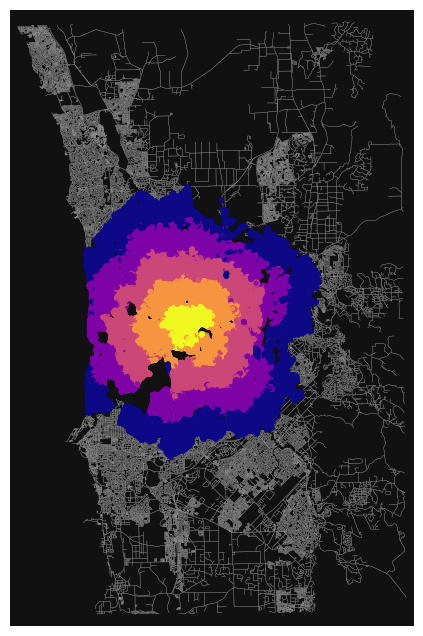

In [98]:
node_colors = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance="time")
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else "none" for node in G.nodes()]
ns = [15 if node in node_colors else 0 for node in G.nodes()]
fig, ax = ox.plot_graph(
    G,
    node_color=nc,
    node_size=ns,
    node_alpha=0.8,
    edge_linewidth=0.2,
    edge_color="#999999",
)

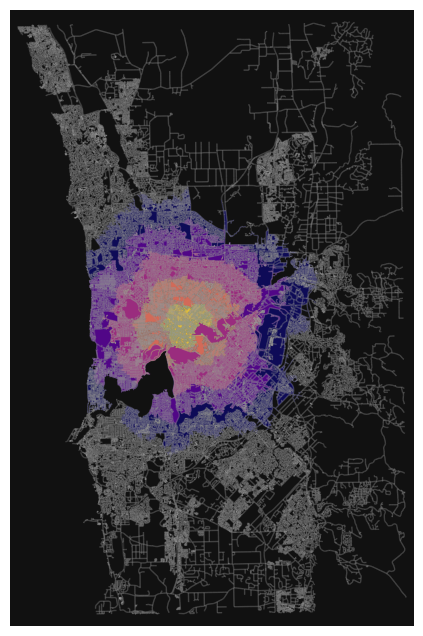

In [99]:
def make_iso_polys(G, edge_buff=25, node_buff=50, infill=False):
    isochrone_polys = []
    for trip_time in sorted(trip_times, reverse=True):
        subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance="time")

        node_points = [Point((data["x"], data["y"])) for node, data in subgraph.nodes(data=True)]
        nodes_gdf = gpd.GeoDataFrame({"id": list(subgraph.nodes)}, geometry=node_points)
        nodes_gdf = nodes_gdf.set_index("id")

        edge_lines = []
        for n_fr, n_to in subgraph.edges():
            f = nodes_gdf.loc[n_fr].geometry
            t = nodes_gdf.loc[n_to].geometry
            edge_lookup = G.get_edge_data(n_fr, n_to)[0].get("geometry", LineString([f, t]))
            edge_lines.append(edge_lookup)

        n = nodes_gdf.buffer(node_buff).geometry
        e = gpd.GeoSeries(edge_lines).buffer(edge_buff).geometry
        all_gs = list(n) + list(e)
        new_iso = gpd.GeoSeries(all_gs).unary_union

        # try to fill in surrounded areas so shapes will appear solid and
        # blocks without white space inside them
        if infill:
            new_iso = Polygon(new_iso.exterior)
        isochrone_polys.append(new_iso)
    return isochrone_polys


# make the isochrone polygons
isochrone_polys = make_iso_polys(G, edge_buff=25, node_buff=0, infill=True)
gdf = gpd.GeoDataFrame(geometry=isochrone_polys)

# plot the network then add isochrones as colored polygon patches
fig, ax = ox.plot_graph(
    G, show=False, close=False, edge_color="#999999", edge_alpha=0.2, node_size=0
)
gdf.plot(ax=ax, color=iso_colors, ec="none", alpha=0.6, zorder=-1)
plt.show()

In [100]:
# make the isochrone polygons
isochrone_polys = []
for trip_time in sorted(trip_times, reverse=True):
    subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance="time")
    node_points = [Point((data["x"], data["y"])) for node, data in subgraph.nodes(data=True)]
    bounding_poly = gpd.GeoSeries(node_points).unary_union.convex_hull
    isochrone_polys.append(bounding_poly)
gdf = gpd.GeoDataFrame(geometry=isochrone_polys)

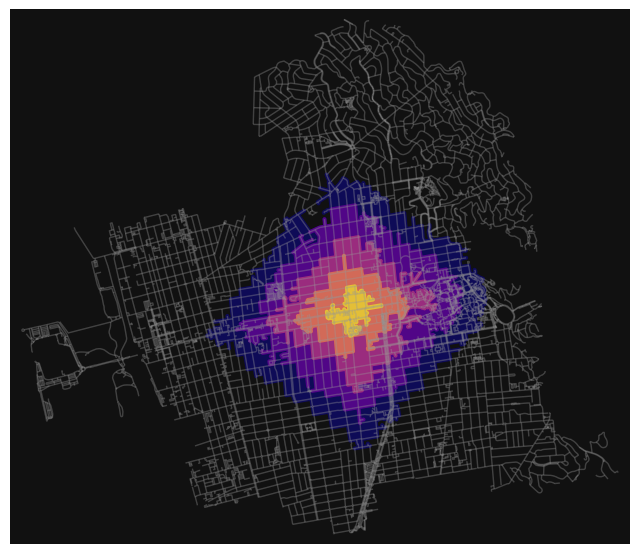

In [ ]:
fig, ax = ox.plot_graph(
    G, show=False, close=False, edge_color="#999999", edge_alpha=0.2, node_size=0
)
gdf.plot(ax=ax, color=iso_colors, ec="none", alpha=0.6, zorder=-1)
plt.show()

In [88]:
def get_route(source_geo, dest_geo, go_type='drive', weight='travel_time',plot=True):
    source_node = ox.nearest_nodes(graph_type[go_type], source_geo[1],source_geo[0])
    target_node = ox.nearest_nodes(graph_type[go_type], dest_loc[1],dest_loc[0])

    route = nx.(graph_type[go_type], source_node, target_node, weight=weight)

    edge_lengths = ox.utils_graph.get_route_edge_attributes(graph_type[go_type], route, 'length')
    edge_travel_time = ox.utils_graph.get_route_edge_attributes( graph_type[go_type], route, 'travel_time')
    total_route_length = round(sum(edge_lengths), 1)
    route_travel_time  = round(sum(edge_travel_time)/60, 2)
    if plot:
      ox.plot_graph_route(graph_type[go_type], route, route_color='r',node_size=0, figsize=(40,40))
    return route, total_route_length, route_travel_time

In [104]:
source_loc=(-31.9702,115.7815)
dest_loc=(-31.873282693252403, 115.88126350694547)

In [105]:
 ox.get_nearest_node(G,source_loc )

AttributeError: ignored

<ipython-input-86-d23f670583a1>:7: UserWarning: The `get_route_edge_attributes` function has been deprecated and will be removed in a future release. Use the `route_to_gdf` function instead.
  edge_lengths = ox.utils_graph.get_route_edge_attributes(graph_type[go_type], route, 'length')
<ipython-input-86-d23f670583a1>:8: UserWarning: The `get_route_edge_attributes` function has been deprecated and will be removed in a future release. Use the `route_to_gdf` function instead.
  edge_travel_time = ox.utils_graph.get_route_edge_attributes( graph_type[go_type], route, 'travel_time')


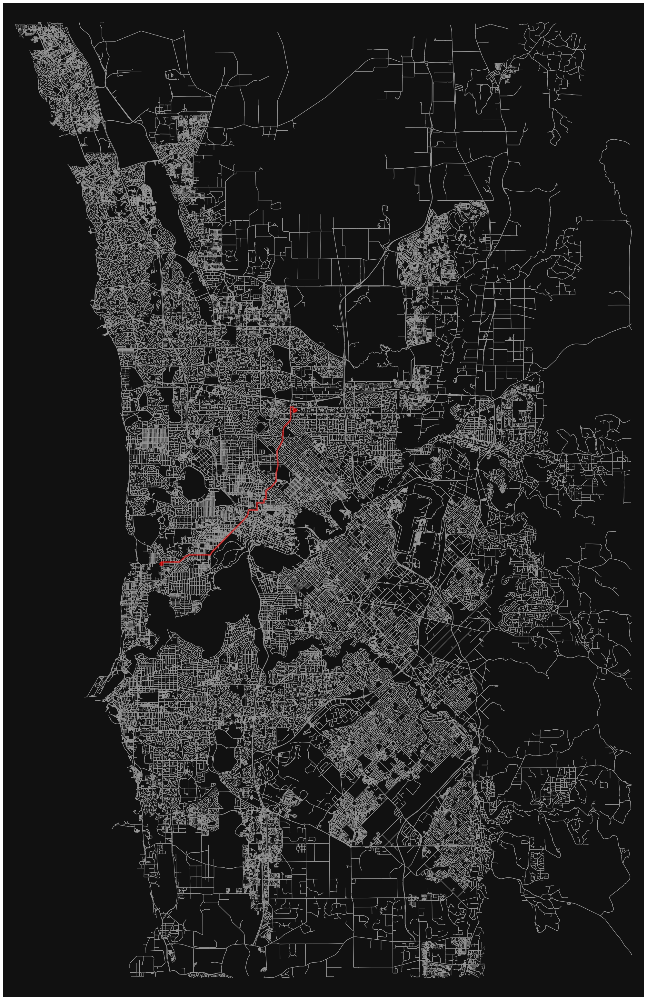

([50596514,
  6246243539,
  6246243538,
  6300280113,
  6246243488,
  6246243537,
  6246243536,
  5372486849,
  1818739900,
  6216042604,
  6216042611,
  5372486847,
  5372486863,
  359000707,
  6216042692,
  6216042668,
  31335993,
  358993564,
  6216042622,
  31335994,
  31335998,
  1835325375,
  1835325322,
  1835325366,
  31335999,
  6216042676,
  358993373,
  606949303,
  6216042653,
  32881636,
  32881637,
  720635587,
  10086780740,
  358993527,
  6216201976,
  10086780743,
  32530484,
  32530483,
  907807910,
  6449615262,
  572486057,
  6216202493,
  9670096670,
  9670096672,
  6216202492,
  9670096671,
  6216202490,
  6216202491,
  6216202489,
  566514547,
  566514548,
  566514549,
  566514551,
  566514552,
  6241561196,
  566514553,
  6216202525,
  566514557,
  6241561197,
  566514558,
  6241561198,
  566514559,
  6320227461,
  6216202609,
  6216202599,
  566514577,
  566514578,
  6216202583,
  571098194,
  31337940,
  6429588920,
  31337941,
  6216202595,
  571098195,
  661

In [ ]:
get_route(source_loc,dest_loc)

In [ ]:
df_2.iloc[2]

BookingNumber                                                            7490752-R
BookingType                                                                Booking
Client                                                              JETCONNECT LTD
NoOfPax                                                                        5.0
NoOfLegs                                                                       1.0
Port                                                                     MELBOURNE
VehicleType                                               PEOPLE MOVER (6-7 SEATS)
VehicleSeatCapacity                                                            6.0
IsBus                                                                          1.0
VehicleCode                                                                    129
VehicleColour                                                                Black
VehicleInsuranceExpiryDate                                     2023-09-20 00:00:00
vehi

In [ ]:
print(source_loc)

[-31.9702, 115.7815]


In [ ]:
from pyrosm.data import sources
sources.available.keys()

dict_keys(['africa', 'antarctica', 'asia', 'australia_oceania', 'central_america', 'europe', 'north_america', 'south_america', 'cities', 'subregions'])

### null values removal

<Axes: >

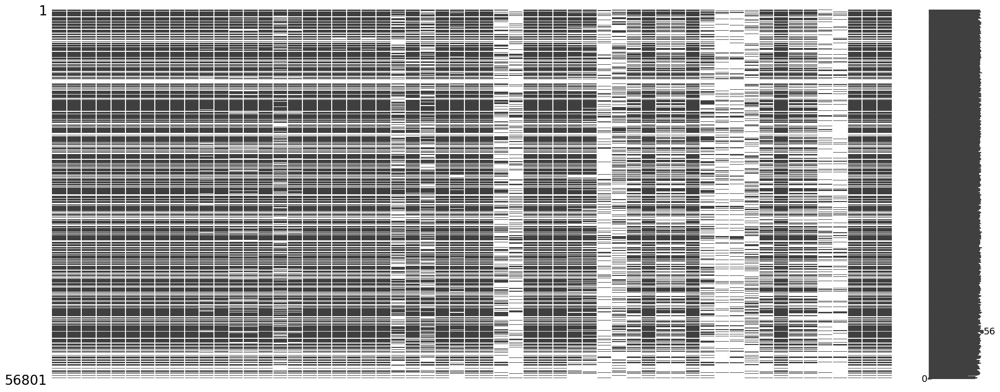

In [ ]:
msno.matrix(df_2)

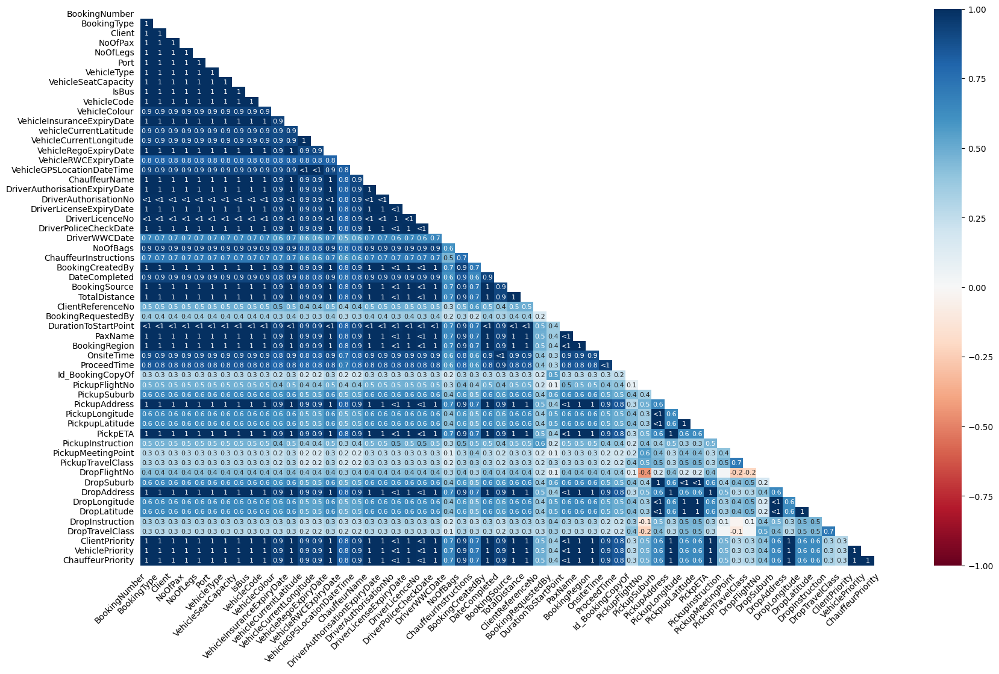

In [ ]:
fig = msno.heatmap(df_2,fontsize=10)
fig_copy = fig.get_figure()
fig_copy.savefig('heatmap.png', bbox_inches = 'tight')

In [ ]:
print(missing_values_table(df_2))

Your selected dataframe has 57 columns.
There are 57 columns that have missing values.
                               Missing Values  % of Total Values
PickupMeetingPoint                      48081               84.6
Id_BookingCopyOf                        48007               84.5
DropTravelClass                         47673               83.9
PickupTravelClass                       47008               82.8
DropInstruction                         45540               80.2
BookingRequestedBy                      43424               76.4
DropFlightNo                            40266               70.9
PickupInstruction                       37211               65.5
PickupFlightNo                          37010               65.2
ClientReferenceNo                       36293               63.9
DropLongitude                           29057               51.2
DropLatitude                            29057               51.2
PickupLongitude                         29053               51.1
Pic

In [ ]:
df_3=df_2.dropna()

In [ ]:
df_2.dtypes

BookingNumber                            object
BookingType                              object
Client                                   object
NoOfPax                                 float64
NoOfLegs                                float64
Port                                     object
VehicleType                              object
VehicleSeatCapacity                     float64
IsBus                                   float64
VehicleCode                              object
VehicleColour                            object
VehicleInsuranceExpiryDate       datetime64[ns]
vehicleCurrentLatitude                  float64
VehicleCurrentLongitude                 float64
VehicleRegoExpiryDate            datetime64[ns]
VehicleRWCExpiryDate             datetime64[ns]
VehicleGPSLocationDateTime       datetime64[ns]
ChauffeurName                            object
DriverAuthorisationExpiryDate    datetime64[ns]
DriverAuthorisationNo                    object
DriverLicenseExpiryDate          datetim

In [ ]:
column_used=['Client','ChauffeurName','ChauffeurPriority','PickpETA','BookingType','NoOfPax','NoOfLegs','Port','VehicleType','VehicleSeatCapacity','IsBus','VehicleColour','VehicleInsuranceExpiryDate','vehicleCurrentLatitude','VehicleCurrentLongitude','VehicleRegoExpiryDate','VehicleRWCExpiryDate','VehicleGPSLocationDateTime','DriverAuthorisationExpiryDate','DriverPoliceCheckDate','NoOfBags','BookingCreatedBy','DateCompleted','BookingSource','TotalDistance','DurationToStartPoint','BookingRegion','OnsiteTime','ProceedTime','PickupAddress','PickupLongitude','PickpupLatitude','PickupTravelClass','DropAddress','DropLongitude','DropLatitude','ClientPriority','VehiclePriority',]

In [ ]:
df_3=df_2[column_used].copy(deep=True)

<Axes: >

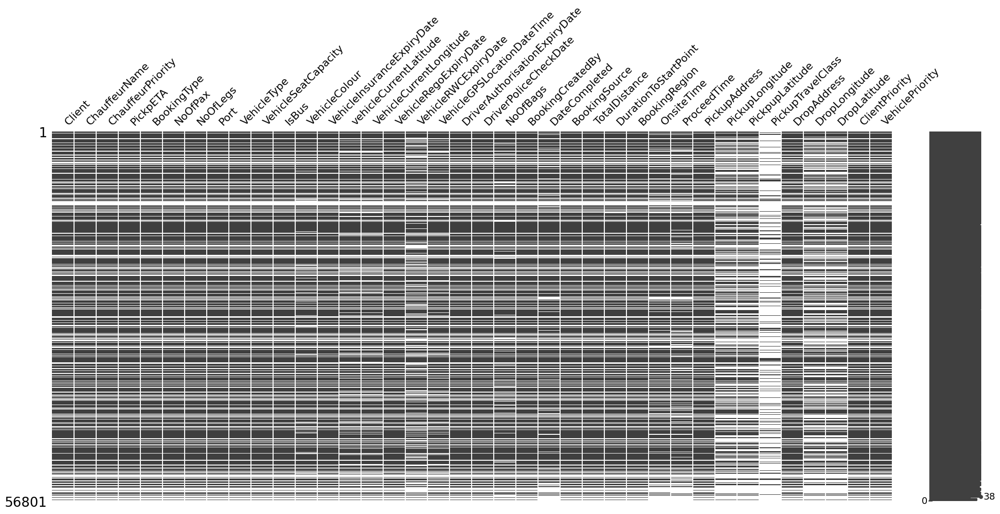

In [ ]:
msno.matrix(df_3)

In [ ]:
df_4=df_3.dropna(subset=column_used[:3], how='all')

<Axes: >

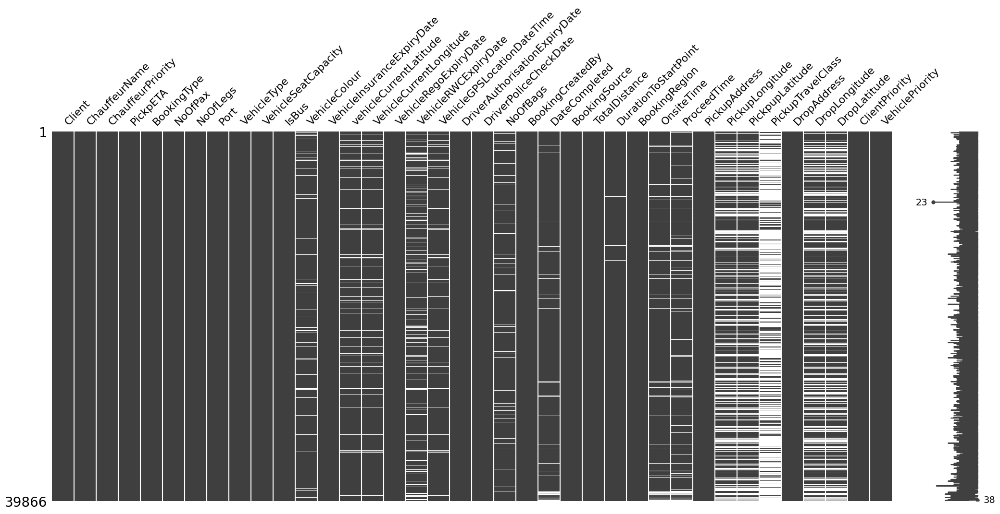

In [ ]:
msno.matrix(df_4)

In [ ]:
numerical_cols = [cname for cname in df_4.columns if df_4[cname].dtype in ['int64', 'float64']]
categorical_cols=[cname for cname in df_4.columns if df_4[cname].dtype in ['object']]
datetime_cols=[cname for cname in df_4.columns if df_4[cname].dtype in ['<M8[ns]']]


In [ ]:
df_dfm=df_4.copy()

In [ ]:
df_dfm

,Client,ChauffeurName,ChauffeurPriority,PickpETA,BookingType,NoOfPax,NoOfLegs,Port,VehicleType,VehicleSeatCapacity,...,ProceedTime,PickupAddress,PickupLongitude,PickpupLatitude,PickupTravelClass,DropAddress,DropLongitude,DropLatitude,ClientPriority,VehiclePriority
1,JETCONNECT LTD,BIBHUSAN JOSHI,High,2023-07-02 17:04:31,Booking,7.0,1.0,MELBOURNE,PEOPLE MOVER (6-7 SEATS),6.0,...,2023-07-02 17:04:31.000,MELBOURNE AIRPORT,144.865610,-37.690280,Economy,443 DOCKLANDS DRIVE,144.945550,-37.819260,Low,Low
2,JETCONNECT LTD,VAN HUYNH,High,2023-07-02 06:20:00,Booking,5.0,1.0,MELBOURNE,PEOPLE MOVER (6-7 SEATS),6.0,...,2023-07-02 06:22:24.000,443 DOCKLANDS DRIVE,144.945550,-37.819260,NaN,MELBOURNE AIRPORT,144.865610,-37.690280,Low,Low
3,VIRGIN AUSTRALIA HOLDINGS LTD - PERTH,SAM AGGARWAL,Medium,2023-07-02 09:32:11,Booking,1.0,1.0,PERTH,SEDAN,3.0,...,2023-07-02 09:32:11.000,707 WELLINGTON STREET,115.857420,-31.952650,NaN,"81 Verde Drive, Jandakot WA, Australia",115.867045,-32.121848,Low,Low
4,VIRGIN AUSTRALIA HOLDINGS LTD - DARWIN,JAMIE DYSON,Medium,2023-07-02 14:20:00,Booking,6.0,1.0,DARWIN,13 SEATER BUS,13.0,...,2023-07-02 14:26:17.000,1 FENTON COURT,NaN,NaN,NaN,43 Knuckey Street,NaN,NaN,Low,Low
5,VIRGIN AUSTRALIA HOLDINGS LTD - DARWIN,LUIS ARANDES,Low,2023-07-02 16:40:00,Booking,4.0,1.0,DARWIN,13 SEATER BUS,13.0,...,2023-07-02 17:22:15.160,43 Knuckey Street,NaN,NaN,NaN,1 FENTON COURT,NaN,NaN,Low,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56739,JETSTAR AIRWAYS,ADEL HANA,High,2023-08-03 17:55:00,Booking,1.0,1.0,SYDNEY,SEDAN,3.0,...,NaT,TERMINAL 2,151.179910,-33.933840,Premium Economy,Cnr O'Riordan & Robey Street,151.194620,-33.929760,Low,Low
56740,HUGHES CREDIT CARD ACCOUNT,SAAD (SID) MASUD,High,2023-08-03 15:30:00,Booking,2.0,1.0,SYDNEY,PREMIUM SEDAN,3.0,...,NaT,"32A Moruben Road, Mosman NSW, Australia",151.245639,-33.822501,NaN,"Sydney Airport (SYD), Mascot NSW, Australia",151.181694,-33.950031,Low,High
56744,AIR NEW ZEALAND CREW SYDNEY,MIKE MOUSSA,Medium,2023-08-04 15:55:00,Booking,5.0,1.0,SYDNEY,LUXURY MINIBUS (9-12 SEATS),11.0,...,NaT,4 CENTRAL PARK AVENUE,151.198110,-33.888460,NaN,TERMINAL 1,151.166730,-33.935670,Low,High
56752,AIR NEW ZEALAND CREW SYDNEY,MARWAN (MARVIN) TAOUK,Medium,2023-08-04 07:15:00,Booking,5.0,1.0,SYDNEY,LUXURY MINIBUS (9-12 SEATS),11.0,...,NaT,191 O'RIORDAN STREET,151.194620,-33.929760,NaN,TERMINAL 1,151.166730,-33.935670,Low,Medium


## DeepFM
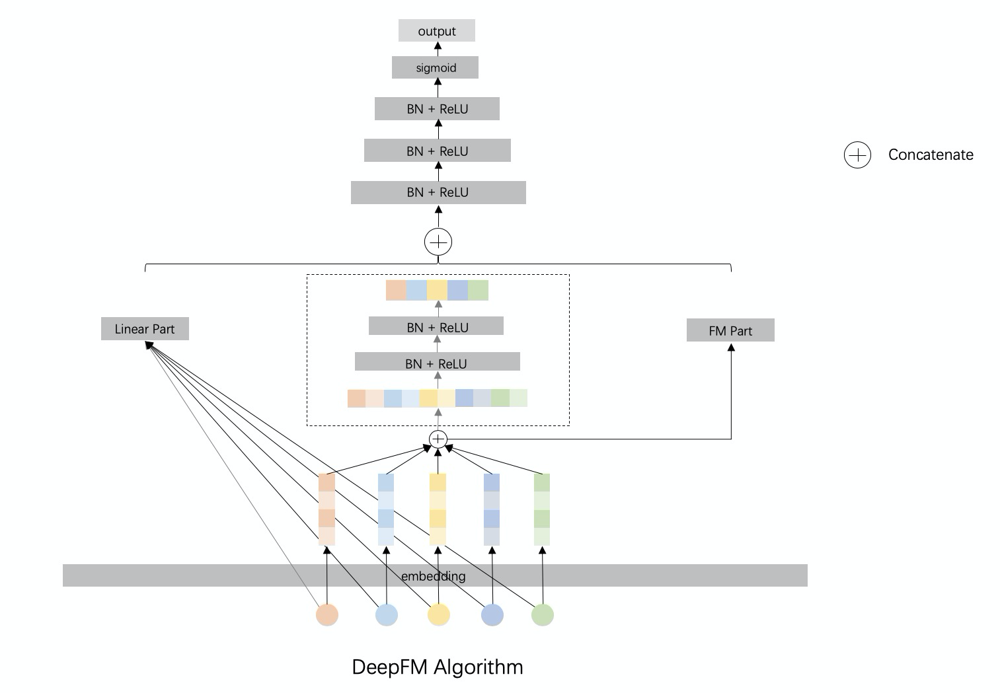

In [ ]:
!pip install -U deepctr-torch
!pip install category-encoders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.0/83.0 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 2.7 MB/s eta 0:00:00


In [ ]:
import torch
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

from deepctr_torch.inputs import SparseFeat, get_feature_names,DenseFeat
from deepctr_torch.models import DeepFM
import matplotlib.pyplot as plt
import warnings
import math
from sklearn.preprocessing import LabelEncoder ,MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.feature_selection import RFE
from sklearn.model_selection import GridSearchCV
import random
import gzip
import category_encoders as ce

In [ ]:
from sklearn.metrics import log_loss, roc_auc_score,accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score,roc_curve
import statsmodels.api as sm
from sklearn.metrics import precision_score,recall_score

In [ ]:
device = 'cpu'
use_cuda = True
if use_cuda and torch.cuda.is_available():
        print('cuda ready...')
        device = 'cuda:0'

In [ ]:
label='ChauffeurPriority'
target = [label]
dense_features = [cname for cname in df_dfm.columns if df_dfm[cname].dtype in ['int64', 'float64']]
sparse_features=[cname for cname in df_dfm.columns if df_dfm[cname].dtype in ['object']]
sparse_features.remove(label)

In [ ]:
sparse_features

['Client',
 'ChauffeurName',
 'BookingType',
 'Port',
 'VehicleType',
 'VehicleColour',
 'BookingCreatedBy',
 'BookingSource',
 'BookingRegion',
 'PickupAddress',
 'PickupTravelClass',
 'DropAddress',
 'ClientPriority',
 'VehiclePriority']

In [ ]:
#label
df_dfm.loc[df_dfm[label] == "High", label] = 1
df_dfm.loc[df_dfm[label] != 1, label] = 0

In [ ]:
df_dfm[label]=df_dfm[label].astype('int64')

In [ ]:
df_dfm[label]

1        1
2        1
3        0
4        0
5        0
        ..
56739    1
56740    1
56744    0
56752    0
56780    0
Name: ChauffeurPriority, Length: 39866, dtype: int64

In [ ]:
df_dfm[sparse_features] = df_dfm[sparse_features].fillna('-1', )
df_dfm[dense_features] = df_dfm[dense_features].fillna(0, )
for feat in sparse_features:
        lbe = LabelEncoder()
        df_dfm[feat] = lbe.fit_transform(df_dfm[feat])
mms = MinMaxScaler(feature_range=(0, 1))
df_dfm[dense_features] = mms.fit_transform(df_dfm[dense_features])

In [ ]:
#unique features for each sparse field
fixlen_feature_columns = [SparseFeat(feat, vocabulary_size=df_dfm[feat].max() + 1, embedding_dim=4)
                              for feat in sparse_features] + [DenseFeat(feat, 1, )
                                                              for feat in dense_features]


In [ ]:
fixlen_feature_columns

[SparseFeat(name='Client', vocabulary_size=470, embedding_dim=4, use_hash=False, dtype='int32', embedding_name='Client', group_name='default_group'),
 SparseFeat(name='ChauffeurName', vocabulary_size=388, embedding_dim=4, use_hash=False, dtype='int32', embedding_name='ChauffeurName', group_name='default_group'),
 SparseFeat(name='BookingType', vocabulary_size=2, embedding_dim=4, use_hash=False, dtype='int32', embedding_name='BookingType', group_name='default_group'),
 SparseFeat(name='Port', vocabulary_size=7, embedding_dim=4, use_hash=False, dtype='int32', embedding_name='Port', group_name='default_group'),
 SparseFeat(name='VehicleType', vocabulary_size=21, embedding_dim=4, use_hash=False, dtype='int32', embedding_name='VehicleType', group_name='default_group'),
 SparseFeat(name='VehicleColour', vocabulary_size=17, embedding_dim=4, use_hash=False, dtype='int32', embedding_name='VehicleColour', group_name='default_group'),
 SparseFeat(name='BookingCreatedBy', vocabulary_size=87, embed

In [ ]:
dnn_feature_columns = fixlen_feature_columns
linear_feature_columns = fixlen_feature_columns

feature_names = get_feature_names(
        linear_feature_columns + dnn_feature_columns)
feature_names

['Client',
 'ChauffeurName',
 'BookingType',
 'Port',
 'VehicleType',
 'VehicleColour',
 'BookingCreatedBy',
 'BookingSource',
 'BookingRegion',
 'PickupAddress',
 'PickupTravelClass',
 'DropAddress',
 'ClientPriority',
 'VehiclePriority',
 'NoOfPax',
 'NoOfLegs',
 'VehicleSeatCapacity',
 'IsBus',
 'vehicleCurrentLatitude',
 'VehicleCurrentLongitude',
 'NoOfBags',
 'TotalDistance',
 'DurationToStartPoint',
 'PickupLongitude',
 'PickpupLatitude',
 'DropLongitude',
 'DropLatitude']

In [ ]:
train, test = train_test_split(df_dfm, test_size=0.2)
train_model_input = {name: train[name] for name in feature_names}
test_model_input = {name: test[name] for name in feature_names}
train

,Client,ChauffeurName,ChauffeurPriority,PickpETA,BookingType,NoOfPax,NoOfLegs,Port,VehicleType,VehicleSeatCapacity,...,ProceedTime,PickupAddress,PickupLongitude,PickpupLatitude,PickupTravelClass,DropAddress,DropLongitude,DropLatitude,ClientPriority,VehiclePriority
49463,116,10,0,2023-07-31 22:20:00,0,0.02,0.1,5,17,0.0625,...,2023-07-31 22:32:29.653,875,0.999144,0.135671,0,6495,0.997858,0.144983,2,2
13875,301,43,1,2023-07-10 15:02:00,0,0.28,0.1,6,3,0.5000,...,2023-07-10 15:02:12.000,5604,0.989851,0.060257,0,5248,0.989694,0.060759,2,2
20913,215,285,0,2023-07-19 06:00:00,0,0.12,0.1,5,15,0.1250,...,2023-07-19 06:03:38.000,3910,0.997598,0.143787,0,6495,0.997820,0.144899,2,2
45548,180,210,0,2023-07-31 18:30:00,0,0.08,0.1,0,14,0.1250,...,2023-07-31 19:21:00.833,5606,0.936714,0.047122,2,2622,0.936013,0.047912,2,1
19587,117,352,0,2023-07-13 16:15:00,0,0.04,0.1,6,15,0.1250,...,2023-07-13 16:23:24.000,1900,0.990191,0.062480,0,7535,0.989575,0.060683,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34357,451,160,0,2023-07-21 00:20:00,0,0.02,0.1,3,15,0.1250,...,2023-07-21 00:29:25.000,5892,0.355301,0.498091,0,3804,0.345285,0.498360,2,1
6,117,77,1,2023-07-02 15:37:44,0,0.04,0.1,6,19,0.0625,...,2023-07-02 15:37:44.000,6313,0.989608,0.061279,0,7535,0.989575,0.060683,2,1
21339,116,54,0,2023-07-15 06:41:00,0,0.08,0.1,5,15,0.1250,...,2023-07-15 07:26:47.000,5613,0.997891,0.144526,1,86,0.999072,0.136835,2,2
6415,151,38,0,2023-07-06 18:20:00,0,0.02,0.1,3,17,0.0625,...,2023-07-06 19:00:29.000,5892,0.963289,0.011731,2,2399,0.963153,0.010619,2,2


In [ ]:
train_model_input

{'Client': 49463    116
 13875    301
 20913    215
 45548    180
 19587    117
         ... 
 34357    451
 6        117
 21339    116
 6415     151
 16965    114
 Name: Client, Length: 31892, dtype: int64,
 'ChauffeurName': 49463     10
 13875     43
 20913    285
 45548    210
 19587    352
         ... 
 34357    160
 6         77
 21339     54
 6415      38
 16965    267
 Name: ChauffeurName, Length: 31892, dtype: int64,
 'BookingType': 49463    0
 13875    0
 20913    0
 45548    0
 19587    0
         ..
 34357    0
 6        0
 21339    0
 6415     0
 16965    0
 Name: BookingType, Length: 31892, dtype: int64,
 'Port': 49463    5
 13875    6
 20913    5
 45548    0
 19587    6
         ..
 34357    3
 6        6
 21339    5
 6415     3
 16965    3
 Name: Port, Length: 31892, dtype: int64,
 'VehicleType': 49463    17
 13875     3
 20913    15
 45548    14
 19587    15
          ..
 34357    15
 6        19
 21339    15
 6415     17
 16965    19
 Name: VehicleType, Length: 31892,

In [ ]:
model = DeepFM(linear_feature_columns=linear_feature_columns, dnn_feature_columns=dnn_feature_columns,
                   task='binary',
                   l2_reg_embedding=1e-1, device=device)
model.compile("adagrad", "binary_crossentropy",
                  metrics=["binary_crossentropy", "auc"], )

In [ ]:
model.fit(train_model_input, train[target].values, batch_size=512, epochs=4, verbose=2,
                        validation_split=0.15)

cpu
Train on 27108 samples, validate on 4784 samples, 53 steps per epoch
Epoch 1/4
2s - loss:  0.2847 - binary_crossentropy:  0.2825 - auc:  0.9251 - val_binary_crossentropy:  0.0545 - val_auc:  0.9990
Epoch 2/4
1s - loss:  0.0341 - binary_crossentropy:  0.0301 - auc:  0.9994 - val_binary_crossentropy:  0.0184 - val_auc:  0.9998
Epoch 3/4
1s - loss:  0.0180 - binary_crossentropy:  0.0137 - auc:  0.9997 - val_binary_crossentropy:  0.0112 - val_auc:  0.9999
Epoch 4/4
1s - loss:  0.0133 - binary_crossentropy:  0.0091 - auc:  0.9998 - val_binary_crossentropy:  0.0080 - val_auc:  1.0000


In [ ]:
pred_ans = model.predict(test_model_input, 1000)

In [ ]:
ypred=[]
for i in pred_ans:
    ypred.append(round(i[0]))

In [ ]:

print("")
print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))
print("test Roc accuracy ", round(roc_auc_score(test[target].values,ypred), 4))
print("test f1 score", round(f1_score(test[target].values,ypred), 4))
print("test precision score", round(precision_score(test[target].values,ypred), 4))
print("test recall score", round(recall_score(test[target].values,ypred), 4))
print("test accuracy score", round(accuracy_score(test[target].values,ypred), 4))



test LogLoss 0.0096
test AUC 0.9998
test Roc accuracy  0.9971
test f1 score 0.9961
test precision score 0.9968
test recall score 0.9953
test accuracy score 0.9981


## try 2

In [ ]:
!pip install LibRecommender

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 11.4 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
from libreco.data import random_split, DatasetFeat,DatasetPure
from libreco.algorithms import DeepFM
from libreco.algorithms import NCF
from libreco.evaluation import evaluate

Instructions for updating:
non-resource variables are not supported in the long term


In [ ]:
df_4.reset_index()

,index,Client,ChauffeurName,ChauffeurPriority,PickpETA,BookingType,NoOfPax,NoOfLegs,Port,VehicleType,...,ProceedTime,PickupAddress,PickupLongitude,PickpupLatitude,PickupTravelClass,DropAddress,DropLongitude,DropLatitude,ClientPriority,VehiclePriority
0,1,JETCONNECT LTD,BIBHUSAN JOSHI,High,2023-07-02 17:04:31,Booking,7.0,1.0,MELBOURNE,PEOPLE MOVER (6-7 SEATS),...,2023-07-02 17:04:31.000,MELBOURNE AIRPORT,144.865610,-37.690280,Economy,443 DOCKLANDS DRIVE,144.945550,-37.819260,Low,Low
1,2,JETCONNECT LTD,VAN HUYNH,High,2023-07-02 06:20:00,Booking,5.0,1.0,MELBOURNE,PEOPLE MOVER (6-7 SEATS),...,2023-07-02 06:22:24.000,443 DOCKLANDS DRIVE,144.945550,-37.819260,NaN,MELBOURNE AIRPORT,144.865610,-37.690280,Low,Low
2,3,VIRGIN AUSTRALIA HOLDINGS LTD - PERTH,SAM AGGARWAL,Medium,2023-07-02 09:32:11,Booking,1.0,1.0,PERTH,SEDAN,...,2023-07-02 09:32:11.000,707 WELLINGTON STREET,115.857420,-31.952650,NaN,"81 Verde Drive, Jandakot WA, Australia",115.867045,-32.121848,Low,Low
3,4,VIRGIN AUSTRALIA HOLDINGS LTD - DARWIN,JAMIE DYSON,Medium,2023-07-02 14:20:00,Booking,6.0,1.0,DARWIN,13 SEATER BUS,...,2023-07-02 14:26:17.000,1 FENTON COURT,NaN,NaN,NaN,43 Knuckey Street,NaN,NaN,Low,Low
4,5,VIRGIN AUSTRALIA HOLDINGS LTD - DARWIN,LUIS ARANDES,Low,2023-07-02 16:40:00,Booking,4.0,1.0,DARWIN,13 SEATER BUS,...,2023-07-02 17:22:15.160,43 Knuckey Street,NaN,NaN,NaN,1 FENTON COURT,NaN,NaN,Low,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39861,56739,JETSTAR AIRWAYS,ADEL HANA,High,2023-08-03 17:55:00,Booking,1.0,1.0,SYDNEY,SEDAN,...,NaT,TERMINAL 2,151.179910,-33.933840,Premium Economy,Cnr O'Riordan & Robey Street,151.194620,-33.929760,Low,Low
39862,56740,HUGHES CREDIT CARD ACCOUNT,SAAD (SID) MASUD,High,2023-08-03 15:30:00,Booking,2.0,1.0,SYDNEY,PREMIUM SEDAN,...,NaT,"32A Moruben Road, Mosman NSW, Australia",151.245639,-33.822501,NaN,"Sydney Airport (SYD), Mascot NSW, Australia",151.181694,-33.950031,Low,High
39863,56744,AIR NEW ZEALAND CREW SYDNEY,MIKE MOUSSA,Medium,2023-08-04 15:55:00,Booking,5.0,1.0,SYDNEY,LUXURY MINIBUS (9-12 SEATS),...,NaT,4 CENTRAL PARK AVENUE,151.198110,-33.888460,NaN,TERMINAL 1,151.166730,-33.935670,Low,High
39864,56752,AIR NEW ZEALAND CREW SYDNEY,MARWAN (MARVIN) TAOUK,Medium,2023-08-04 07:15:00,Booking,5.0,1.0,SYDNEY,LUXURY MINIBUS (9-12 SEATS),...,NaT,191 O'RIORDAN STREET,151.194620,-33.929760,NaN,TERMINAL 1,151.166730,-33.935670,Low,Medium


In [ ]:
df_model2=df_4[['Client','ChauffeurName','ChauffeurPriority','PickpETA']].copy(deep=True)

In [ ]:
df_model2.rename(columns = {'Client':'user'}, inplace = True)
df_model2.rename(columns = {'ChauffeurName':'item'}, inplace = True)
df_model2.rename(columns = {'ChauffeurPriority':'label'}, inplace = True)
df_model2.rename(columns = {'PickpETA':'time'}, inplace = True)

# split into train and test data based on time

In [ ]:
df_model2['time'] = pd.to_datetime(df_model2['time']).astype(int)/ 10**9

In [ ]:
df_model2['time'] = pd.to_datetime(df_model2['time']).astype(int)

In [ ]:
df_model2.head(10)

,user,item,label,time
1,JETCONNECT LTD,BIBHUSAN JOSHI,High,1688317471
2,JETCONNECT LTD,VAN HUYNH,High,1688278800
3,VIRGIN AUSTRALIA HOLDINGS LTD - PERTH,SAM AGGARWAL,Medium,1688290331
4,VIRGIN AUSTRALIA HOLDINGS LTD - DARWIN,JAMIE DYSON,Medium,1688307600
5,VIRGIN AUSTRALIA HOLDINGS LTD - DARWIN,LUIS ARANDES,Low,1688316000
6,EMIRATES AIRWAYS - SYDNEY,CLEM FARALLO,High,1688312264
7,EMIRATES AIRWAYS - SYDNEY,DANNY HUANG,Medium,1688315885
9,HUGHES CREDIT CARD ACCOUNT,ANDREW BUTTRICK,Medium,1688288400
10,EMIRATES AIRWAYS - SYDNEY,AWAIS SHEHZAD,Medium,1688315400
12,EMIRATES AIRWAYS - PERTH,SAM SAAD,Medium,1688317320


In [ ]:
df_model2

,user,item,label,time
1,JETCONNECT LTD,BIBHUSAN JOSHI,High,1688317471
2,JETCONNECT LTD,VAN HUYNH,High,1688278800
3,VIRGIN AUSTRALIA HOLDINGS LTD - PERTH,SAM AGGARWAL,Medium,1688290331
4,VIRGIN AUSTRALIA HOLDINGS LTD - DARWIN,JAMIE DYSON,Medium,1688307600
5,VIRGIN AUSTRALIA HOLDINGS LTD - DARWIN,LUIS ARANDES,Low,1688316000
...,...,...,...,...
56739,JETSTAR AIRWAYS,ADEL HANA,High,1691085300
56740,HUGHES CREDIT CARD ACCOUNT,SAAD (SID) MASUD,High,1691076600
56744,AIR NEW ZEALAND CREW SYDNEY,MIKE MOUSSA,Medium,1691164500
56752,AIR NEW ZEALAND CREW SYDNEY,MARWAN (MARVIN) TAOUK,Medium,1691133300


In [ ]:
!pip install dython
from dython.nominal import associations # correlation calculation
from scipy.stats import chi2_contingency

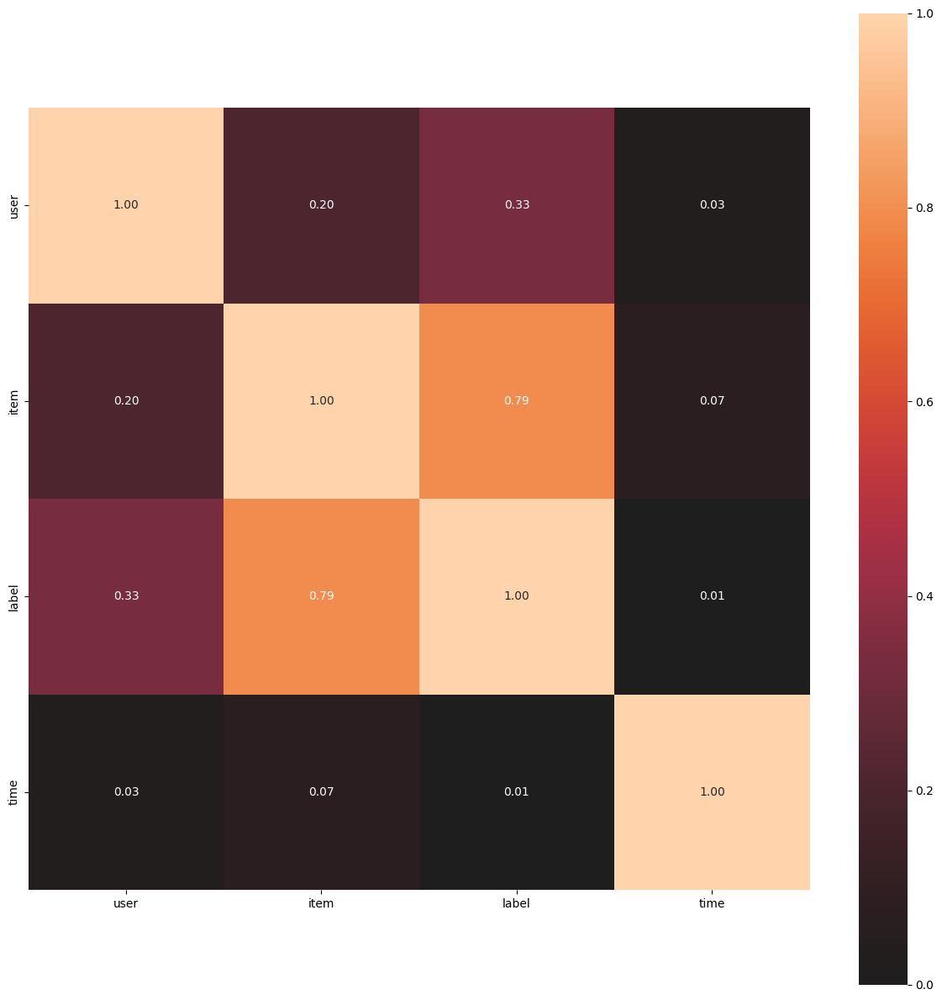

In [ ]:
correlation_matrix = associations(df_model2, compute_only=False, figsize=(15,15))

In [ ]:
sparse_features=['user','item','label']
df_model2[sparse_features] = df_model2[sparse_features].fillna('-1', )
for feat in sparse_features:
        lbe = LabelEncoder()
        df_model2[feat] = lbe.fit_transform(df_model2[feat])

In [ ]:
user_history = dict(df_model2.groupby('user')['item'].apply(list))

In [ ]:
import numpy as np
import pandas as pd
from libreco.data import random_split, DatasetPure
from libreco.algorithms import LightGCN  # pure data, algorithm LightGCN
from libreco.evaluation import evaluate

data =df_model2

train_data, eval_data, test_data = random_split(data, multi_ratios=[0.8, 0.1, 0.1])

train_data, data_info = DatasetPure.build_trainset(train_data)
eval_data = DatasetPure.build_evalset(eval_data)
test_data = DatasetPure.build_testset(test_data)
print(data_info)
lightgcn = LightGCN(
    task="ranking",
    data_info=data_info,
    loss_type="bpr",
    embed_size=16,
    n_epochs=300,
    lr=1e-3,
    batch_size=2048,
    num_neg=1,
    device="cuda",
)
lightgcn.fit(
    train_data,
    neg_sampling=True,
    verbose=2,
    eval_data=eval_data,
    metrics=["loss", "roc_auc", "precision", "recall", "ndcg"],
)

evaluate(
    model=lightgcn,
    data=test_data,
    neg_sampling=True,
    metrics=["loss", "roc_auc", "precision", "recall", "ndcg"],
)

lightgcn.predict(user=467, item=269)
# recommend 7 items for user 2211
lightgcn.recommend_user(user=467, n_rec=7)

# # cold-start prediction
# lightgcn.predict(user="ccc", item="not item", cold_start="average")
# # cold-start recommendation
# lightgcn.recommend_user(user="are we good?", n_rec=7, cold_start="popular")

In [ ]:
correct=0
total=0
cnt=[]
for key in user_history.keys():
  flag=0
  for i in user_history[key]:
    cnt.append(lightgcn.predict(user=key, item=i)[0])
    if lightgcn.predict(user=key, item=i)[0]>.8:
      flag=1
      break
  if flag:
    correct+=1
  total+=1
print(correct,total)

Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unknown interaction(s), position: [0]
Detect 1 unkn

In [ ]:
cnt

[0.8854323,
 0.72672534,
 0.8992378,
 0.9915936,
 0.9878418,
 0.91765296,
 0.9717525,
 0.9221412,
 0.4831784,
 0.9708527,
 0.98836774,
 0.8823239,
 0.9565643,
 0.94533765,
 0.9939972,
 0.9986072,
 0.99883837,
 0.9996132,
 0.9693638,
 0.8958765,
 0.878238,
 0.7807281,
 0.55293125,
 0.8793181,
 0.9185798,
 0.8942919,
 0.97359335,
 0.29257432,
 0.7866663,
 0.97564167,
 0.8413159,
 0.9833483,
 0.961875,
 0.59590644,
 0.99341476,
 0.87674147,
 0.92496437,
 0.9561681,
 0.86684227,
 0.15117212,
 0.9341359,
 0.89099026,
 0.99441963,
 0.87925655,
 0.9109473,
 0.9636688,
 0.98082745,
 0.90522534,
 0.8366478,
 0.8484033,
 0.671875,
 0.6804637,
 0.89650345,
 0.947267,
 0.8304948,
 0.8767691,
 0.9247614,
 0.90333176,
 0.9244169,
 0.9269854,
 0.96100295,
 0.996031,
 0.9428819,
 0.7702697,
 0.9374921,
 0.9352753,
 0.967912,
 0.9623641,
 0.84284526,
 0.95283717,
 0.7921521,
 0.9222065,
 0.9266696,
 0.95455194,
 0.83258826,
 0.74004793,
 0.7234452,
 0.7647991,
 0.96744776,
 0.91737336,
 0.9676885,
 0.8

In [ ]:
df_model2

,user,item,label,time
1,199,58,1,1688317471
2,199,367,1,1688278800
3,453,316,3,1688290331
4,450,157,3,1688307600
5,450,196,2,1688316000
...,...,...,...,...
56739,202,3,1,1691085300
56740,180,310,1,1691076600
56744,16,227,3,1691164500
56752,16,212,3,1691133300


In [ ]:
df_model2.columns

Index(['user', 'item', 'label', 'time'], dtype='object')

In [ ]:
train_data, eval_data, test_data = random_split(df_model2, multi_ratios=[0.8, 0.1, 0.1])

In [ ]:
train_data, data_info= DatasetPure.build_trainset(train_data)
eval_data = DatasetPure.build_evalset(eval_data)
test_data = DatasetPure.build_testset(test_data)

ncf

In [ ]:
ncf = NCF(
    task="rating",
    data_info=data_info,
    loss_type="cross_entropy",
    embed_size=16,
    n_epochs=10,
    lr=1e-3,
    batch_size=2048,
    num_neg=1,
)
ncf.fit(
    train_data,
    neg_sampling=False,
    verbose=2,
    eval_data=eval_data,
    metrics=["loss"],
)

evaluate(
    model=ncf,
    data=test_data,
    neg_sampling=False,
    metrics=["loss"],
)

Training start time: 2023-12-11 06:24:27


/usr/local/lib/python3.10/dist-packages/libreco/layers/dense.py:31: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  net = tf.layers.batch_normalization(net, training=is_training)
Instructions for updating:
Colocations handled automatically by placer.
/usr/local/lib/python3.10/dist-packages/libreco/layers/dense.py:39: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  net = tf.layers.batch_normalization(net, training=is_training)
train: 100%|██████████| 32/32 [00:01<00:00, 30

Epoch 1 elapsed: 1.054s
	 train_loss: 5.112


eval_pointwise: 100%|██████████| 1/1 [00:00<00:00, 10.96it/s]


	 eval rmse: 2.0111


train: 100%|██████████| 32/32 [00:00<00:00, 71.63it/s]


Epoch 2 elapsed: 0.455s
	 train_loss: 2.2328


eval_pointwise: 100%|██████████| 1/1 [00:00<00:00, 72.73it/s]


	 eval rmse: 0.9525


train: 100%|██████████| 32/32 [00:00<00:00, 70.03it/s]


Epoch 3 elapsed: 0.469s
	 train_loss: 0.2271


eval_pointwise: 100%|██████████| 1/1 [00:00<00:00, 43.72it/s]


	 eval rmse: 0.8150


train: 100%|██████████| 32/32 [00:00<00:00, 71.11it/s]


Epoch 4 elapsed: 0.462s
	 train_loss: 0.1136


eval_pointwise: 100%|██████████| 1/1 [00:00<00:00, 61.59it/s]


	 eval rmse: 0.7931


train: 100%|██████████| 32/32 [00:00<00:00, 69.59it/s]


Epoch 5 elapsed: 0.472s
	 train_loss: 0.08


eval_pointwise: 100%|██████████| 1/1 [00:00<00:00, 48.28it/s]


	 eval rmse: 0.7880


train: 100%|██████████| 32/32 [00:00<00:00, 68.04it/s]


Epoch 6 elapsed: 0.482s
	 train_loss: 0.0735


eval_pointwise: 100%|██████████| 1/1 [00:00<00:00, 62.87it/s]


	 eval rmse: 0.7783


train: 100%|██████████| 32/32 [00:00<00:00, 94.61it/s]


Epoch 7 elapsed: 0.348s
	 train_loss: 0.0677


eval_pointwise: 100%|██████████| 1/1 [00:00<00:00, 69.88it/s]


	 eval rmse: 0.7665


train: 100%|██████████| 32/32 [00:00<00:00, 100.78it/s]


Epoch 8 elapsed: 0.327s
	 train_loss: 0.0654


eval_pointwise: 100%|██████████| 1/1 [00:00<00:00, 81.53it/s]


	 eval rmse: 0.7491


train: 100%|██████████| 32/32 [00:00<00:00, 107.25it/s]


Epoch 9 elapsed: 0.306s
	 train_loss: 0.0605


eval_pointwise: 100%|██████████| 1/1 [00:00<00:00, 51.89it/s]


	 eval rmse: 0.7303


train: 100%|██████████| 32/32 [00:00<00:00, 111.93it/s]


Epoch 10 elapsed: 0.297s
	 train_loss: 0.0573


eval_pointwise: 100%|██████████| 1/1 [00:00<00:00, 60.20it/s]


	 eval rmse: 0.7038


eval_pointwise: 100%|██████████| 1/1 [00:00<00:00, 68.44it/s]


{'loss': 0.7195539}

In [ ]:
dense_col = [cname for cname in df_model2.columns if df_model2[cname].dtype in ['int64', 'float64']]
sparse_col=[cname for cname in df_model2.columns if df_model2[cname].dtype in ['object']]
user_col = ["BookingType", "NoOfPax", "occupation",'NoOfBags','BookingSource','BookingCreatedBy','TotalDistance','BookingRegion','PickupAddress','PickupLongitude','PickpupLatitude','PickupTravelClass','DropAddress','DropLongitude','DropLatitude','VehiclePriority']
item_col = ["VehicleType", "genre2", "NoOfLegs",'Port','VehicleType','VehicleSeatCapacity','IsBus','VehicleColour','DurationToStartPoint','vehicleCurrentLatitude','VehicleCurrentLongitude','ClientPriority']
train_data, data_info = DatasetFeat.build_trainset(df_4, user_col, item_col, sparse_col, dense_col)

ValueError: ignored

## try 3

In [ ]:
!pip install -q tensorflow-ranking
!pip install -q --upgrade tensorflow-datasets

In [ ]:
!pip install --upgrade protobuf

In [ ]:
from typing import Dict, Tuple
import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_ranking as tfr

In [ ]:
df_model3=df_4.copy(deep=True)

In [ ]:
df_model3.columns

In [ ]:
import

## further imputation and feature transformation

In [ ]:
len(numerical_cols),len(datetime_cols),len(categorical_cols),len(df_4.columns)

In [ ]:
from sklearn.impute import SimpleImputer
df4_mode = df_4.copy(deep=True)
mode_imputer = SimpleImputer(strategy='most_frequent')
df4_mode.iloc[:,:] = mean_imputer.fit_transform(df4_mode)

In [ ]:
msno.matrix(df4_mode)

In [ ]:
f=open('/content/data_after.txt','a')
count=0
for col in df4_mode.columns:
  count+=1
  info=f'{count}){col}  {df4_mode[col].dtype} dtype: \n\n null values \t\t\t {df4_mode[col].isnull().sum()}\n {df4_mode[col].value_counts()}\n\n unique values :{len(df4_mode[col].value_counts())} \n'
  f.write(info)
f.close()

In [ ]:
df4_mode_High=df4_mode[df4_mode['ClientPriority']=='High']
df4_mode_Medium=df4_mode[df4_mode['ClientPriority']=='Medium']
df4_mode_Low=df4_mode[df4_mode['ClientPriority']=='Low']


In [ ]:
len(df4_mode_High),len(df4_mode_Medium),len(df4_mode_Low)

In [ ]:
client_high=set(df4_mode_High["Client"].unique())

In [ ]:
client_low=set(df4_mode_Low["Client"].unique())

In [ ]:
client_medium=set(df4_mode_Medium["Client"].unique())

In [ ]:
print(client_high.intersection(client_low),client_high.intersection(client_medium),client_medium.intersection(client_low))

In [ ]:
client_high

In [ ]:
datetime_cols

In [ ]:
CrosstabResult=pd.crosstab(index=df4_mode['ChauffeurPriority'],columns=df4_mode['ClientPriority'])
print(CrosstabResult)

from scipy.stats import chi2_contingency

# Performing Chi-sq test
ChiSqResult = chi2_contingency(CrosstabResult)

# P-Value is the Probability of H0 being True
# If P-Value>0.05 then only we Accept the assumption(H0)

print('The P-Value of the ChiSq Test is:', ChiSqResult[1])

In [ ]:
import numpy as np
import pandas as pd
!pip install dython
from dython.nominal import associations
from scipy.stats import chi2_contingency

In [ ]:
correlation_matrix = associations(df4_mode, compute_only=True)["corr"]

In [ ]:
correlation_matrix = associations(df4_mode, compute_only=False, figsize=(20,20),annot=False)

### Categorical columns to Nominal and ordinal
```
Nominal: the data can only be categorized. Ordinal: the data can be categorized and ranked.
```

In [ ]:
df4_mode.columns

In [ ]:
df4_mode["DateCompleted"]-df4_mode["ProceedTime"]

In [ ]:
#dataloss
df4_mode=df4_mode[(pd.to_timedelta(df4_mode["ProceedTime"]-df4_mode["OnsiteTime"]).astype('timedelta64[m]').astype(int)>0)]

In [ ]:
datetime_cols

In [ ]:
nominal_cols=['Port','BookingSource','BookingRegion']
ordinal_cols=['BookingType','VehicleType','ClientPriority','VehiclePriority','ChauffeurPriority']
numerical_cols=['NoOfPax','NoOfLegs','VehicleSeatCapacity','IsBus','vehicleCurrentLatitude','VehicleCurrentLongitude','NoOfBags','NoOfBags','TotalDistance','DurationToStartPoint','PickupLongitude','PickupLatitude','DropLongitude','DropLatitude']

In [ ]:
df5 = df4_mode[ordinal_cols+ordinal_cols+nominal_cols].copy()

In [ ]:
from sklearn.preprocessing import OrdinalEncoder
ordinal_encoder = OrdinalEncoder()
df5[ordinal_cols] = ordinal_encoder.fit_transform(df5[ordinal_cols])


In [ ]:
from sklearn.preprocessing import OneHotEncoder
OH_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
OH_cols = pd.DataFrame(OH_encoder.fit_transform(df5[nominal_cols]))

OH_cols.index = df5.index

dropped_df5 = df5.drop(nominal_cols, axis=1)

df_6 = pd.concat([dropped_df5, OH_cols], axis=1)

df_6.columns = df_6.columns.astype(str)

In [ ]:
OH_encoder.feature_names_in_

In [ ]:
len(OH_encoder.get_feature_names_out()),OH_encoder.get_feature_names_out()

In [ ]:
list(df_6.columns)

In [ ]:
df_6

In [ ]:
!pip install kmodes

In [ ]:
# Elbow curve to find optimal K
from kmodes.kmodes import KModes
cost = []
K = range(6,10)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, max_iter=10000,init = "random", n_init = 5, verbose=1)
    kmode.fit_predict(df_6)
    cost.append(kmode.cost_)

plt.plot(K, cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

In [ ]:
df_model3=df_4.copy(deep=True)

In [ ]:
user_col = ["BookingType", "NoOfPax",'NoOfBags','BookingSource','BookingCreatedBy','TotalDistance','BookingRegion','PickupAddress','PickupLongitude','PickpupLatitude','PickupTravelClass','DropAddress','DropLongitude','DropLatitude','VehiclePriority']
item_col = ["NoOfLegs",'Port','VehicleType','VehicleSeatCapacity','IsBus','VehicleColour','DurationToStartPoint','vehicleCurrentLatitude','VehicleCurrentLongitude','ClientPriority']
main_col=['Client','ChauffeurName','ChauffeurPriority','ProceedTime']
user=main_col[0:1]
item=main_col[1:2]
label=main_col[2:3]
time=main_col[3:4]
df_wide_deep=df_model3[user+item+label+time+user_col+item_col].copy(deep=True)

In [ ]:
df_wide_deep.rename(columns = {'Client':'user'}, inplace = True)
df_wide_deep.rename(columns = {'ChauffeurName':'item'}, inplace = True)
df_wide_deep.rename(columns = {'ChauffeurPriority':'label'}, inplace = True)
df_wide_deep.rename(columns = {'ProceedTime':'time'}, inplace = True)

In [ ]:
df_wide_deep.head(2)

In [ ]:
from sklearn.preprocessing import LabelEncoder
sparse_features=['user','item','label']
df_wide_deep[sparse_features] = df_wide_deep[sparse_features].fillna('-1', )
for feat in sparse_features:
        lbe = LabelEncoder()
        df_wide_deep[feat] = lbe.fit_transform(df_wide_deep[feat])

In [ ]:
dataset = df_wide_deep.sort_values(['user', 'time']).reset_index(drop=True)
dataset['one'] = 1
dataset['sample_num'] = dataset.groupby('user')['one'].cumsum()

dataset['target'] = dataset.groupby('user')['item'].shift(-1)
dataset['mean_rate'] = dataset.groupby('user')['label'].cumsum() / dataset['sample_num']

dataset.head()

In [ ]:
dataset['prev_chauffer'] = dataset['item'].apply(lambda x: str(x))
dataset['prev_chauffer'] = dataset.groupby('user')['prev_chauffer'].apply(lambda x: (x + ' ').cumsum().str.strip())
dataset['prev_chauffer'] = dataset['prev_chauffer'].apply(lambda x: x.split())
dataset.head()

In [ ]:
all_cols=['user','item', 'label', 'time','one', 'sample_num', 'target', 'mean_rate', 'prev_chauffer', 'BookingType', 'NoOfPax', 'NoOfBags',
       'BookingSource', 'TotalDistance', 'BookingRegion', 'PickupLongitude', 'PickpupLatitude',
       'PickupTravelClass', 'DropLongitude', 'DropLatitude',
       'VehiclePriority', 'NoOfLegs', 'Port','VehicleType',
       'VehicleSeatCapacity', 'IsBus', 'VehicleColour',
       'vehicleCurrentLatitude', 'VehicleCurrentLongitude', 'ClientPriority',
       ]

In [ ]:
dataset=dataset[all_cols]

In [ ]:
dataset['VehicleType']

In [ ]:
dense_features = [cname for cname in dataset.columns if dataset[cname].dtype in ['int64', 'float64']]
sparse_features=[cname for cname in dataset.columns if dataset[cname].dtype in ['object']]

In [ ]:
sparse_features.remove('prev_chauffer')
sparse_features.remove('VehicleType')

In [ ]:
for col in sparse_features:
 dataset = pd.concat([dataset.drop(col, axis=1), pd.get_dummies(dataset[col])], axis=1)

In [ ]:
dataset['VehicleType']

In [ ]:
all_vehicle=[]
for genre in list(dataset['VehicleType'].unique()):
  if genre==genre:
    import re
    print(genre)
    genre_=genre
    re.sub(r'\W+', '', genre)
    genre=genre.replace(' ','_').lower()
    all_vehicle.append(genre)
    dataset[f'{genre}_rate'] = ((dataset['VehicleType']==genre_)*dataset['label'])
    dataset[genre] = dataset.groupby('user')[f'{genre}_rate'].cumsum()
    dataset[f'{genre}_rate'] = dataset.groupby('user')[f'{genre}_rate'].cumsum() / dataset[genre]

dataset[all_vehicle] = dataset[all_vehicle].apply(lambda x: x / dataset['sample_num'])
dataset.head()

In [ ]:
dataset

In [ ]:
sparse_features

In [ ]:
def get_coo_indexes(lil):
    rows = []
    cols = []
    for i, el in enumerate(lil):
        if type(el)!=list:
            el = [el]
        for j in el:
            rows.append(i)
            cols.append(j)
    return rows, cols

In [ ]:
from scipy.sparse import coo_matrix
import numpy as np

def get_sparse_features(series, shape):
    coo_indexes = get_coo_indexes(series.tolist())
    sparse_df = coo_matrix((np.ones(len(coo_indexes[0])), (coo_indexes[0], coo_indexes[1])), shape=shape)
    return sparse_df

In [ ]:
get_sparse_features(dataset['prev_chauffer'], (len(dataset), dataset['item'].max()+1))

In [ ]:
COLD_START_TRESH = 5
TEST_SIZE = 0.2
filtred_data = dataset[(dataset['sample_num'] >= COLD_START_TRESH) &
                       ~(dataset['label'].isna())].sort_values('time')
train_data = filtred_data[:int(len(filtred_data)*(1-TEST_SIZE))]
test_data = filtred_data[int(len(filtred_data)*(1-TEST_SIZE)):]
train_data.shape, test_data.shape

In [ ]:
print((
    f"Total chauffers: {dataset['item'].nunique()}\n"
    f"chauffers in train: {train_data['item'].nunique()}\n"
    f"chauffers in test: {test_data['item'].nunique()}\n"
))

In [ ]:
list(train_data.columns)

In [ ]:
X_train = train_data.drop(['user', 'item', 'label', 'time', 'one', 'sample_num', 'target', 'prev_chauffer'],
                          axis=1)
prev_movies_train = get_sparse_features(train_data['prev_chauffer'], (len(train_data), dataset['item'].max()+1))
y_train = train_data['label']

X_test = test_data.drop(['user', 'item', 'label', 'time', 'one', 'sample_num', 'target', 'prev_chauffer'],
                        axis=1)
prev_movies_test = get_sparse_features(test_data['prev_chauffer'], (len(test_data), dataset['item'].max()+1))
y_test = test_data['label']

In [ ]:
X_train=X_train.drop('VehicleType',axis=1)
X_test=X_test.drop('VehicleType',axis=1)

In [ ]:
def sparse_to_idx(data, pad_idx=-1):
    indexes = data.nonzero()
    indexes_df = pd.DataFrame()
    indexes_df['rows'] = indexes[0]
    indexes_df['cols'] = indexes[1]
    mdf = indexes_df.groupby('rows').apply(lambda x: x['cols'].tolist())
    max_len = mdf.apply(lambda x: len(x)).max()
    return mdf.apply(lambda x: pd.Series(x + [pad_idx] * (max_len - len(x)))).values

In [ ]:
def idx_to_sparse(idx, sparse_dim):
    sparse = np.zeros(sparse_dim)
    sparse[int(idx)] = 1
    return pd.Series(sparse, dtype=int)

In [ ]:
PAD_IDX = 0
X_train_tensor = torch.Tensor(X_train.fillna(0).values).to(device)
# tensor with sequence of indexes
movies_train_tensor = torch.sparse_coo_tensor(
    indices=prev_movies_train.nonzero(),
    values=[1]*len(prev_movies_train.nonzero()[0]),
    size=prev_movies_train.shape
).to_dense().to(device)
# tensor with binary features
movies_train_idx = torch.Tensor(
    sparse_to_idx(prev_movies_train, pad_idx=PAD_IDX),
).long().to(device)
# target
target_train = torch.Tensor(y_train.values).long().to(device)